***LOADING LIBRARIES***

In [1]:
pip install cellrank --quiet

Note: you may need to restart the kernel to use updated packages.


In [2]:
!pip install scvelo --upgrade --quiet

In [3]:
pip install python-igraph

Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install jgraph --upgrade --quiet

Note: you may need to restart the kernel to use updated packages.


In [5]:
pip install louvain

Note: you may need to restart the kernel to use updated packages.


# IMPORTING LIBRARIES

In [1]:
import cellrank as cr

In [2]:
import scvelo as scv
import pandas as pd
#import velocyto as vcy
import time
import scipy
import pickle
import numpy as np
import pandas as pd
import scanpy as scp
import matplotlib
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib_venn as ven
from matplotlib.gridspec import GridSpec

import sklearn
from sklearn.decomposition import PCA
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, accuracy_score, cohen_kappa_score, confusion_matrix, recall_score, classification_report, precision_score
from scipy.stats import spearmanr, zscore
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import Lasso, Ridge, ElasticNet
import scvelo as scv
scv.logging.print_version()
import jgraph as ig
from sklearn.svm import SVC

Running scvelo 0.2.2 (python 3.8.5) on 2021-02-24 10:02.


In [3]:
import os
os.chdir('/home/sidrah19220/nmd/loomfiles/wild')

In [4]:
scv.logging.print_version()
scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.presenter_view = True  # set max width size for presenter view
scv.set_figure_params('scvelo')  # for beautified visualization
scv.set_figure_params()

Running scvelo 0.2.2 (python 3.8.5) on 2021-02-24 10:03.


In [4]:
file = "wild_type.loom"
adata = scv.read_loom(file)
adata

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


AnnData object with n_obs × n_vars = 20303 × 55487
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

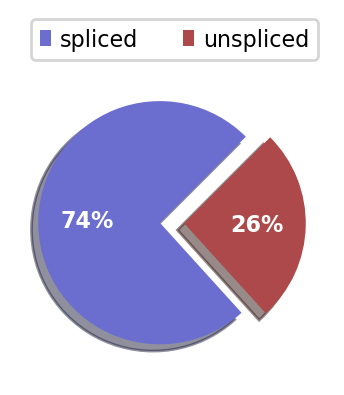

In [6]:
adata.var_names_make_unique()
scv.pl.proportions(adata)

# sub-cluster the OSNs

In [7]:
m = pd.read_csv('wild_mature.csv')

In [8]:
m = m['Unnamed: 0']
m = m.values.tolist()
a = adata.obs.index
a = a.to_list()

In [9]:
l = []
for i in range(len(a)):
    for j in range(len(m)):
        if (a[i] == (m[j])):
            l.append(a[i])

In [10]:
len(l)

3853

In [11]:
im = pd.read_csv('wild_immature.csv')

In [12]:
im = im['Unnamed: 0']
im = im.values.tolist()

In [13]:
li = []
for i in range(len(a)):
    for j in range(len(im)):
        if (a[i] == (im[j])):
            li.append(a[i])

In [14]:
len(li)

751

**The selected cell data is retrieved from metadata**

In [15]:
matcell = l
immatcell = li

In [16]:
mature = adata[matcell,:]
immature = adata[immatcell, :]

In [17]:
mature.obs['cluster'] = 'mature'
immature.obs['cluster'] = 'immature'

Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.


In [18]:
final = mature.concatenate(immature)

In [19]:
i = final.obs.index.tolist()
it = [sub[ : -2] for sub in i]
final.obs.index = it

# SAVING RAW FILE

In [20]:
#file with all genes
bdata = final
bdata.write_loom("raw_data_cluster.loom", write_obsm_varm=True)

In [21]:
final

AnnData object with n_obs × n_vars = 4604 × 55487
    obs: 'cluster', 'batch'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

# STEP 3: The OSN data being processed for analysis

In [5]:
f = scv.read_loom("raw_data_cluster.loom")
f

AnnData object with n_obs × n_vars = 4604 × 55487
    obs: 'batch', 'cluster'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [6]:
all_genes = f.copy()

In [7]:
all_genes

AnnData object with n_obs × n_vars = 4604 × 55487
    obs: 'batch', 'cluster'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [8]:
# filter cells and genes
scp.pp.filter_cells(f, min_genes=200)
scp.pp.filter_genes(f, min_cells=3)

In [9]:
f.var['mt'] = f.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
scp.pp.calculate_qc_metrics(f, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

... storing 'batch' as categorical
... storing 'cluster' as categorical
... storing 'Chromosome' as categorical
... storing 'Strand' as categorical


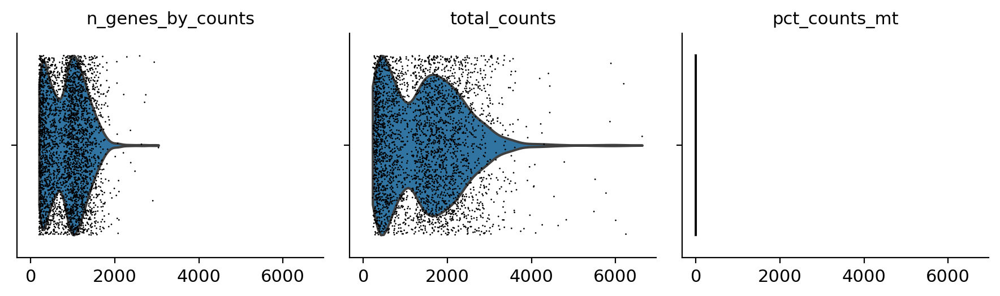

In [10]:
scp.pl.violin(f, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True, save = 'cell_counts.pdf')

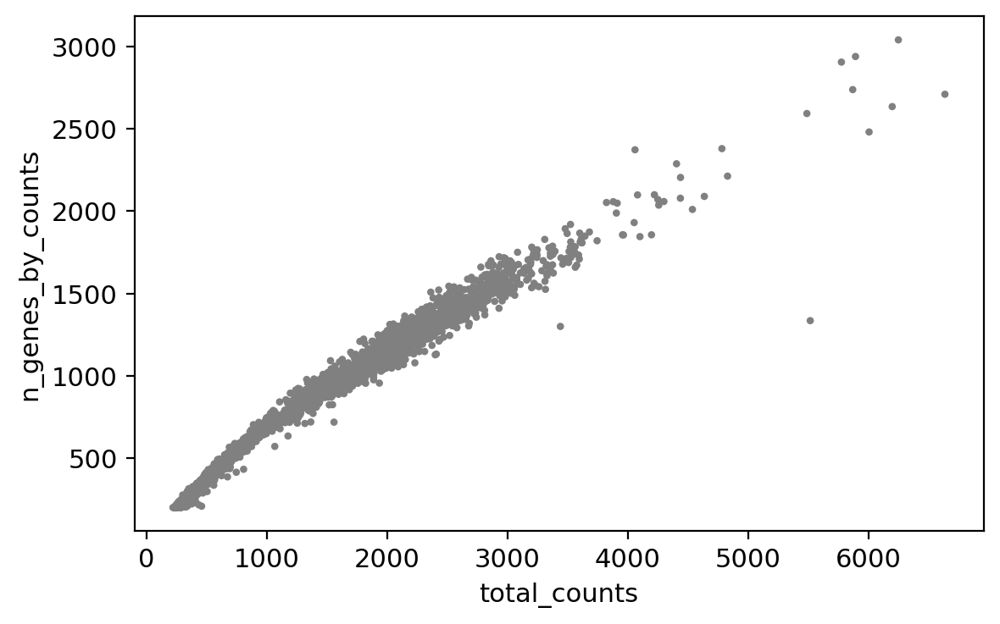

In [11]:
scp.pl.scatter(f, x='total_counts', y='n_genes_by_counts')

In [12]:
f = f[f.obs.n_genes_by_counts < 2500, :]
f = f[f.obs.pct_counts_mt < 5, :]
f

View of AnnData object with n_obs × n_vars = 3093 × 15312
    obs: 'batch', 'cluster', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [13]:
print(f.obs.index)
f.obs['CellID'] = f.obs.index
print(f.obs)
print(f.var.index)
f.var['Gene'] = f.var.index
print(f.var)

Trying to set attribute `.obs` of view, copying.


Index(['AACCGCGGTAAACACA_WT1', 'AAAGATGCAAAGTCAA_WT1', 'AAATGCCCAGCTTAAC_WT1',
       'AACTCCCCAGCCTATA_WT1', 'AACACGTAGTGAACAT_WT1', 'AACACGTTCTGGGCCA_WT1',
       'AACTCAGCACAACGTT_WT1', 'AACCATGTCACCTTAT_WT1', 'AAACGGGGTTCTGAAC_WT1',
       'AAAGATGGTGGAAAGA_WT1',
       ...
       'TTCTCAAGTACCGTAT_WT4', 'TTGAACGAGCTATGCT_WT4', 'TTCTCAACAAGAAAGG_WT4',
       'TTGCGTCGTCAGAAGC_WT4', 'TTTCCTCAGAAACGCC_WT4', 'TTTACTGGTTGACGTT_WT4',
       'TTTGTCACATGCCTTC_WT4', 'TTTACTGGTGAGGCTA_WT4', 'TTTGTCAAGGACAGCT_WT4',
       'TTTATGCTCTGTCTAT_WT4'],
      dtype='object', length=3093)
                     batch   cluster  n_genes  n_genes_by_counts  \
AACCGCGGTAAACACA_WT1     0    mature     1391               1388   
AAAGATGCAAAGTCAA_WT1     0    mature     1328               1326   
AAATGCCCAGCTTAAC_WT1     0    mature      739                737   
AACTCCCCAGCCTATA_WT1     0    mature     1023               1023   
AACACGTAGTGAACAT_WT1     0    mature     1262               1260   
...      

# SAVING FILTERED FILE

In [12]:
#file with all genes
cdata = f
cdata.write_loom("filtered_data_cluster.loom", write_obsm_varm=True)

In [14]:
#basic preprocessing of data
scv.pp.filter_and_normalize(f, n_top_genes=2000)
scv.pp.neighbors(f)
scv.pp.moments(f, n_pcs=30, n_neighbors=30)

Normalized count data: X, spliced, unspliced.
Exctracted 2000 highly variable genes.
Logarithmized X.
computing neighbors
    finished (0:00:02) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [15]:
scv.tl.velocity(f)
scv.tl.velocity_graph(f)

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:03) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [16]:
scv.tl.umap(f, n_components=2)
scv.tl.louvain(f)

# READ RAW DATA AND CHECK EXPRESSION

In [17]:
ddata = scv.read_loom("filtered_data_cluster.loom", sparse=False)
ddata

AnnData object with n_obs × n_vars = 3093 × 15312
    obs: 'batch', 'cluster', 'n_genes', 'n_genes_by_counts', 'pct_counts_mt', 'total_counts', 'total_counts_mt'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'mean_counts', 'mt', 'n_cells', 'n_cells_by_counts', 'pct_dropout_by_counts', 'total_counts'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [18]:
c = f.obs['louvain']
ddata.obs['louvain'] = c

... storing 'batch' as categorical
... storing 'cluster' as categorical
... storing 'Chromosome' as categorical
... storing 'Strand' as categorical


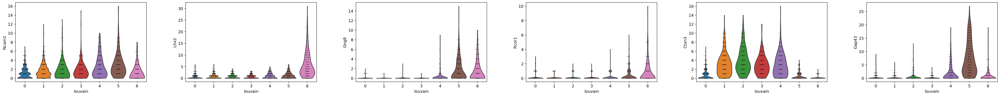

In [19]:
#Expression of Immature neuron marker to assign clusters their stage
immature_neuron_markers = ["Ncam1","Lhx2","Gng8", "Rcor1","Ctxn3","Gap43"]
scp.pl.violin(ddata, keys=immature_neuron_markers, groupby='louvain', save = 'immature_neurons_exp.pdf')

         Falling back to preprocessing with `sc.pp.pca` and default params.


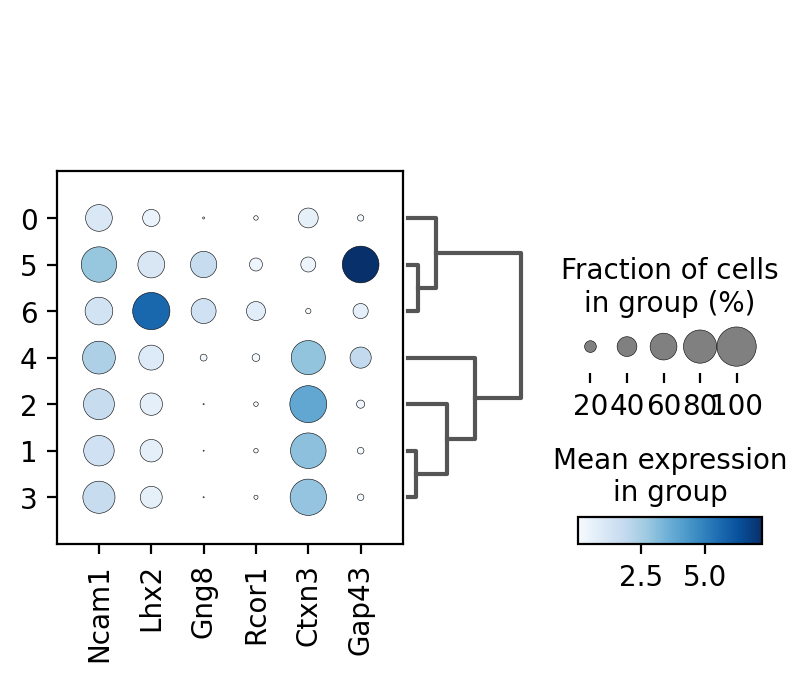

In [20]:
scp.pl.dotplot(ddata, immature_neuron_markers,dendrogram=True, cmap='Blues', groupby='louvain', save = 'dotplot-immature-exp.pdf')

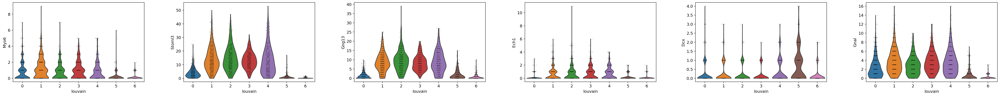

In [21]:
#Mature neuron markers to name the clusters on basis of stage
mature_neuron_markers = ["Myo6", "Stoml3","Gng13","Ech1","Dcx","Gnal"]
scp.pl.violin(ddata, keys=mature_neuron_markers, groupby='louvain', save = 'mature-exp.pdf')

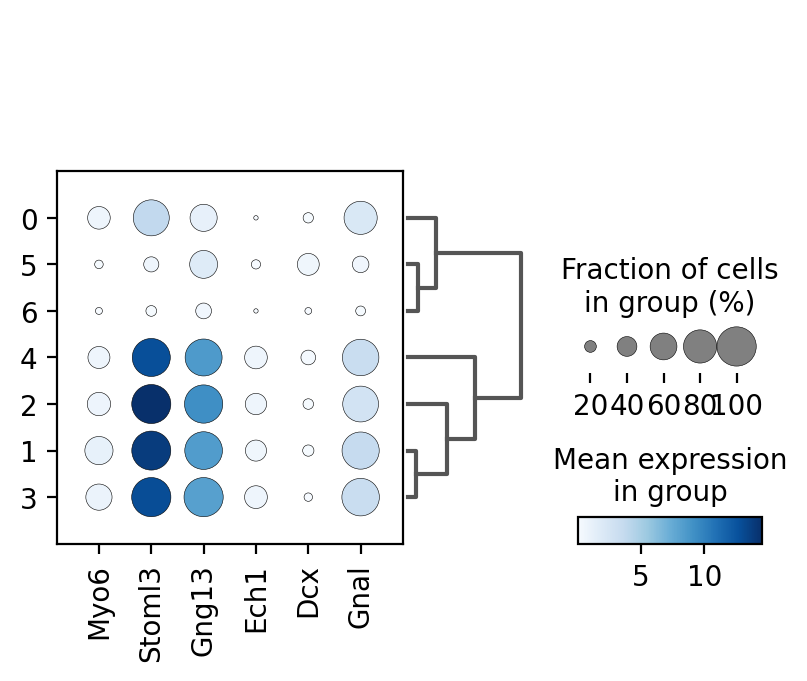

In [22]:
scp.pl.dotplot(ddata, mature_neuron_markers,dendrogram=True, cmap='Blues', groupby='louvain', save = 'dotplot-mature-exp.pdf')

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file ./figures/scvelo_velocity-embedding.pdf


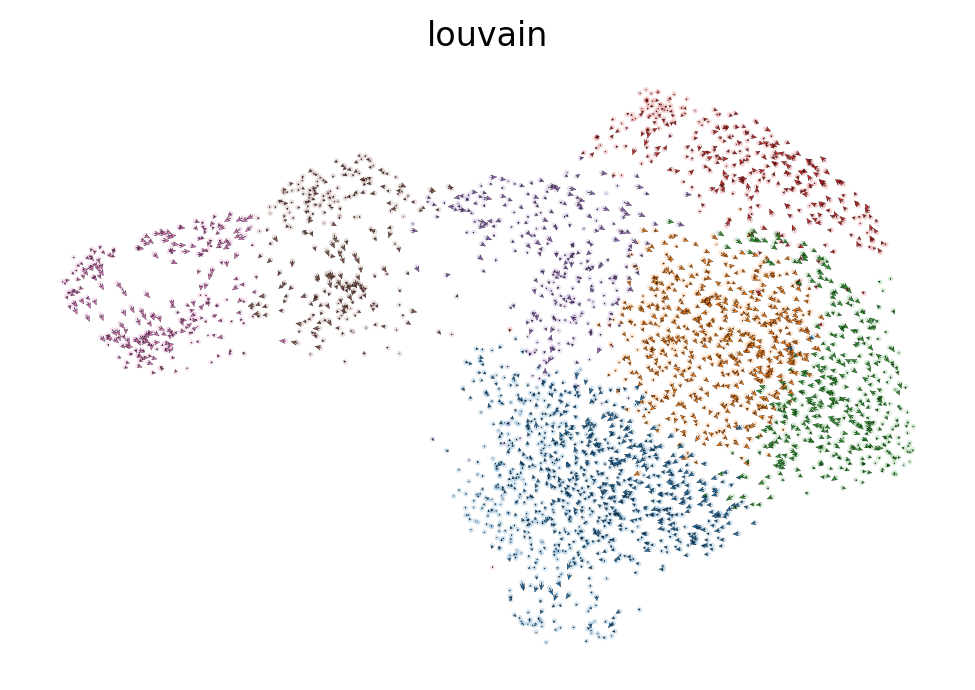

In [23]:
scv.pl.velocity_embedding(f, basis = 'umap', color = 'louvain', save = 'velocity-embedding.pdf')

figure cannot be saved as pdf, using png instead.
saving figure to file ./figures/scvelo_velocity-embedding-stream-steady.pdf.png


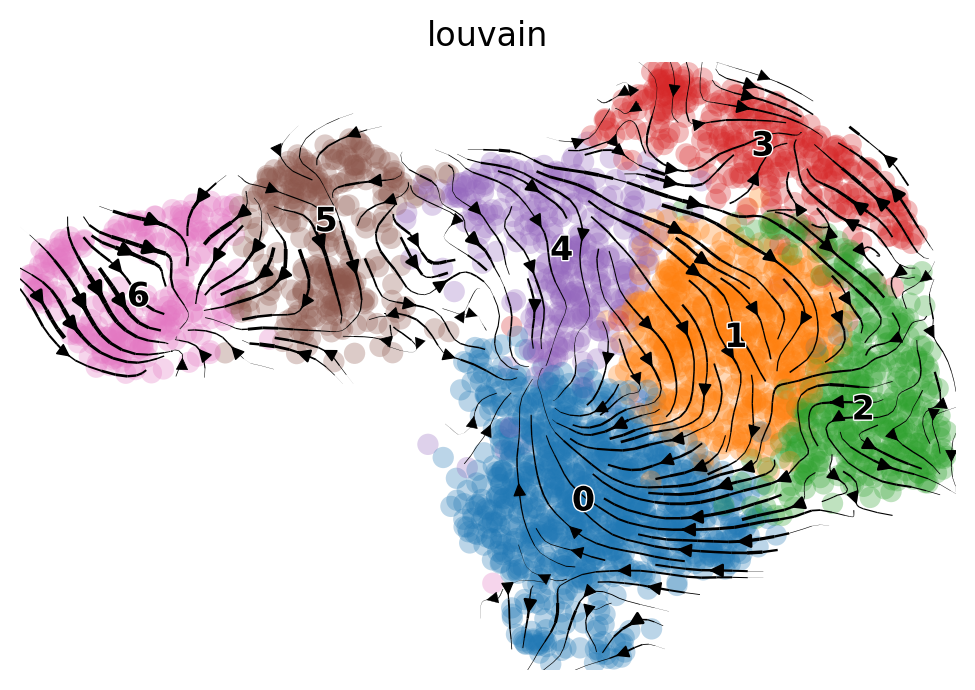

In [24]:
scv.pl.velocity_embedding_stream(f, basis = 'umap', color = "louvain",save = 'velocity-embedding-stream-steady.pdf')

figure cannot be saved as pdf, using png instead.
saving figure to file ./figures/scvelo_velocity-embedding-stream-cluster.pdf.png


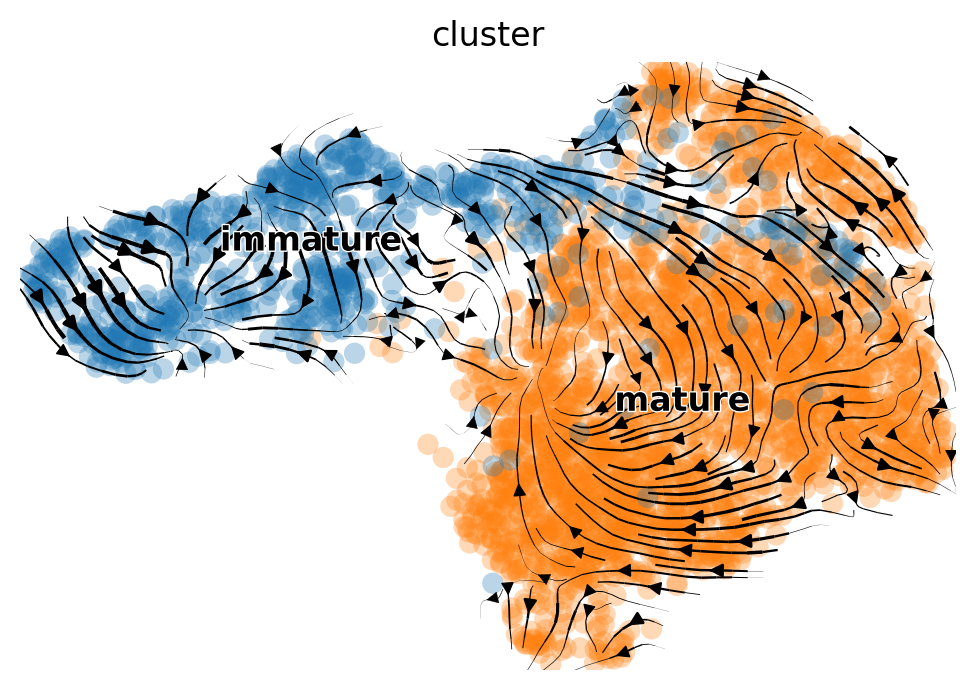

In [25]:
scv.pl.velocity_embedding_stream(f, basis = 'umap', color = "cluster",save = 'velocity-embedding-stream-cluster.pdf')

#Final cluster names


In [26]:
f.obs['celltype'] = 'Immature cells'
f.obs['celltype'][f.obs['louvain']=='0'] = 'Mature cells'
f.obs['celltype'][f.obs['louvain']=='4'] = 'Transition cells'
f.obs['celltype'][f.obs['louvain']=='2'] = 'Mature cells'
f.obs['celltype'][f.obs['louvain']=='3'] = 'Mature cells'
f.obs['celltype'][f.obs['louvain']=='1'] = 'Mature cells'

figure cannot be saved as pdf, using png instead.
saving figure to file ./figures/scvelo_velocity_embedding_stream.pdf.png


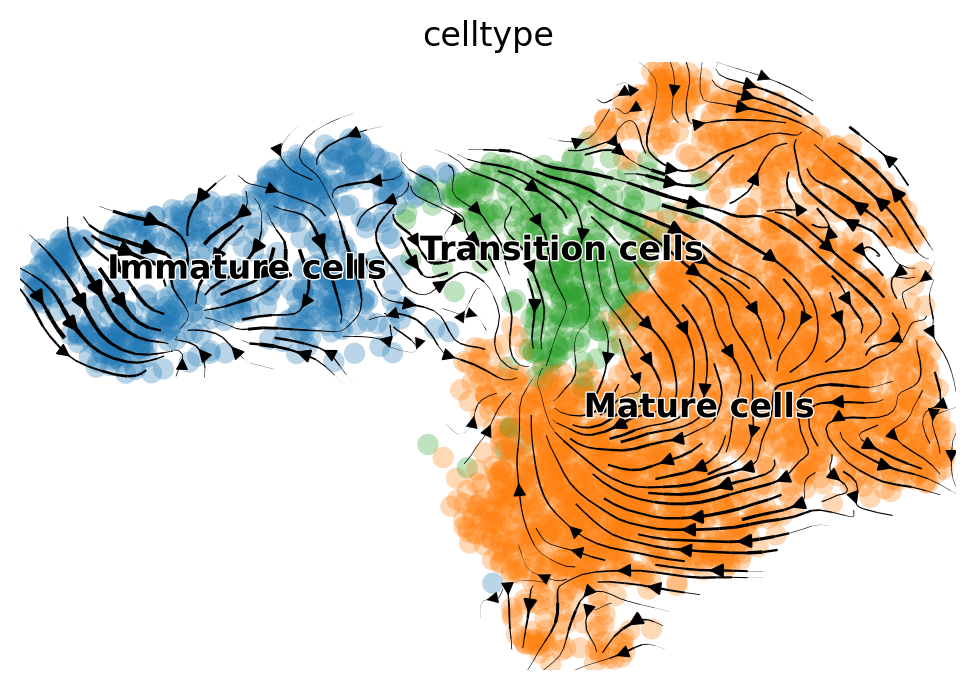

In [27]:
scv.pl.velocity_embedding_stream(f, basis = 'umap', color = 'celltype',save= 'velocity_embedding_stream.pdf')

In [28]:
k = f.obs['celltype']
ddata.obs['celltype'] = k

In [29]:
markers = ["Ncam1","Lhx2","Gng8", "Rcor1","Ctxn3","Gap43", "Myo6", "Stoml3",
                           "Gng13","Ech1","Dcx","Gnal"]

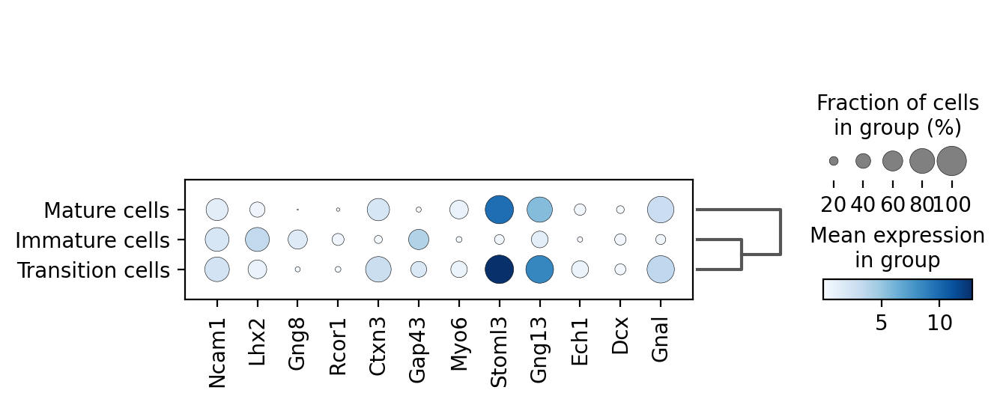

In [30]:
scp.pl.dotplot(ddata, markers,dendrogram=True, cmap='Blues', groupby='celltype', save = 'dotplot_all_markers.pdf')

POINT6

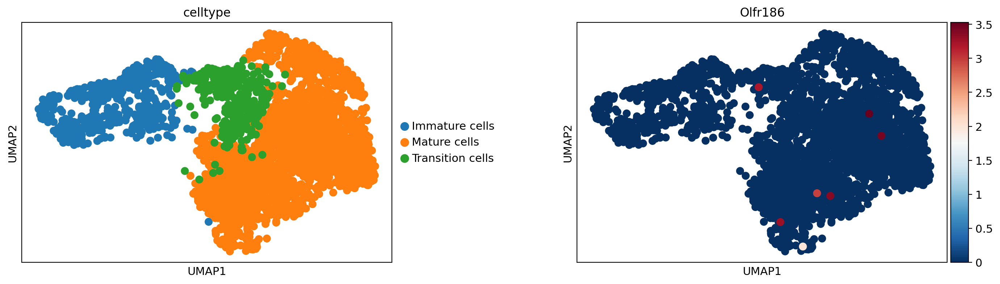

In [39]:
scp.pl.scatter(f, basis = 'umap', color = ['celltype', 'Olfr186'], size = 250, save = 'olfr186-umap.pdf')

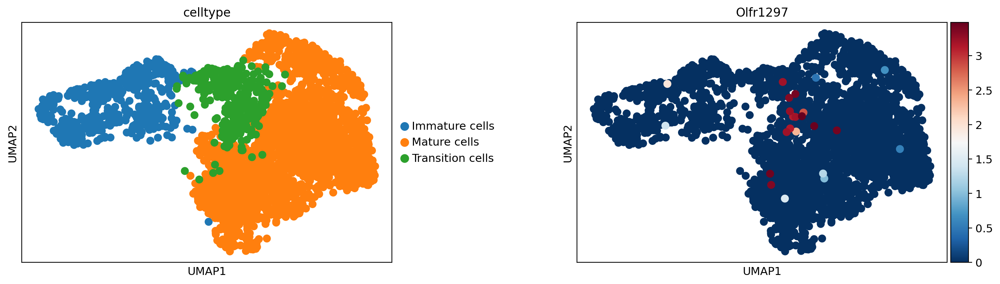

In [40]:
scp.pl.scatter(f, basis = 'umap', color = ['celltype', 'Olfr1297'],size = 250, save = 'olfr1297-umap.pdf')

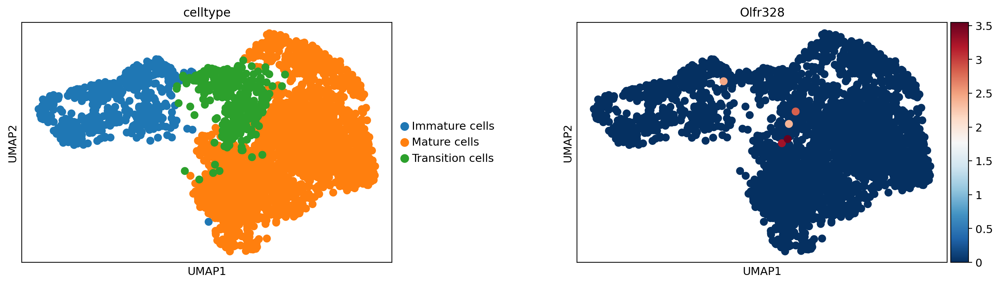

In [41]:
scp.pl.scatter(f, basis = 'umap', color = ['celltype', 'Olfr328'], size = 250,save = 'olfr328-umap.pdf')

EXTRACTING BARCODES

In [31]:
trans = f[f.obs['celltype'] == 'Transition cells']
mature = f[f.obs['celltype'] == 'Mature cells']
immature = f[f.obs['celltype'] == 'Immature cells']

In [39]:
trans_bar = pd.DataFrame(trans.obs.index.tolist())
mat_bar = pd.DataFrame(mature.obs.index.tolist())
imm_bar = pd.DataFrame(immature.obs.index.tolist())

In [42]:
trans_bar.to_csv('transition_barcodes.csv')
mat_bar.to_csv('mature_barcodes.csv')
imm_bar.to_csv('immature_barcodeds')

,0
0,AAATGCCCAGCTTAAC_WT1
1,AACACGTAGTGAACAT_WT1
2,AACACGTTCTGGGCCA_WT1
3,AACTCAGCACAACGTT_WT1
4,AACCATGTCACCTTAT_WT1
...,...
2245,AAGTCTGGTACCAGTT_WT4
2246,AGCCTAAGTCAAGCGA_WT4
2247,CACACCTGTTGTACAC_WT4
2248,CGTAGCGGTAAGAGAG_WT4


# CLUSTER SEGREGATION TO FIND THEIR IDENTITY IN R




IMMATURE

In [53]:
clus = (f.obs["celltype"]  == "Immature cells")
clus1 = f[clus].copy()

In [54]:
clus1_ind = clus1.obs_names

In [55]:
clus1_list = clus1_ind.to_list()
clust1 = adata[clus1_list, :]

Umap coordinates

In [56]:
umap1 = clus1.obsm['X_umap']
umap1 = pd.DataFrame(umap1)
umap1.index = clus1.obs_names

In [57]:
umap1.to_csv('umapimmat.csv')

spliced of mature --- 1

In [58]:
spl1 = clust1.layers['spliced']
spl1 = spl1.todense()
spl1 = pd.DataFrame(spl1)

In [59]:
spl1.columns = clust1.var_names
spl1.index = clust1.obs_names

In [60]:
spl1.to_csv('splimmat.csv')

Unspliced of mature

In [61]:
uspl1 = clust1.layers['unspliced']
uspl1 = uspl1.todense()
uspl1 = pd.DataFrame(uspl1)

In [62]:
uspl1.columns = clust1.var_names
uspl1.index = clust1.obs_names

In [63]:
uspl1.to_csv('usplimma.csv')

TRANSITION

In [64]:
#cluster0 TRANSITION
clus = (f.obs["celltype"]  == "Transition cells")
clus0 = f[clus].copy()

In [65]:
clus0_ind = clus0.obs_names
clus0_list = clus0_ind.to_list()
#clus0_list = [sub[ : -2] for sub in clus0_ind]
clust0 = adata[clus0_list, :]

umap

In [66]:
umap0 = clus0.obsm['X_umap']
umap0 = pd.DataFrame(umap0)
umap0.index = clus0.obs_names

In [67]:
umap0.to_csv('umaptrans.csv')

spliced

In [68]:
spl0 = clust0.layers['spliced']
spl0 = spl0.todense()
spl0 = pd.DataFrame(spl0)
spl0.columns = clust0.var_names
spl0.index = clust0.obs_names

In [69]:
spl0.to_csv('spltrans.csv')

In [70]:
uspl0 = clust0.layers['unspliced']
uspl0 = uspl0.todense()
uspl0 = pd.DataFrame(uspl0)

In [71]:
uspl0.columns = clust0.var_names
uspl0.index = clust0.obs_names

In [72]:
uspl0.to_csv('uspltrans.csv')

#cluster mature

In [73]:
clus = (f.obs["celltype"]  == "Mature cells")
clus4 = f[clus].copy()

In [74]:
clus4_ind = clus4.obs_names
clus4_list = clus4_ind.to_list()
#clus4_list = [sub[ : -2] for sub in clus4_ind]
clust4 = adata[clus4_list, :]


umap

In [75]:
umap4 = clus4.obsm['X_umap']
umap4 = pd.DataFrame(umap4)
umap4.index = clus4.obs_names

In [76]:
umap4.to_csv('umapmature.csv')

spliced

In [77]:
spl4 = clust4.layers['spliced']
spl4 = spl4.todense()
spl4 = pd.DataFrame(spl4)

In [78]:
spl4.columns = clust4.var_names
spl4.index = clust4.obs_names

In [79]:
spl4.to_csv('splmature.csv')

unspliced

In [80]:
uspl4 = clust4.layers['unspliced']
uspl4 = uspl4.todense()
uspl4 = pd.DataFrame(uspl4)

In [81]:
uspl4.columns = clust4.var_names
uspl4.index = clust4.obs_names

In [82]:
uspl4.to_csv('usplmature.csv')

# Downstream analysis
IMPORTANT GENES

In [30]:
#file with all genes
ddata = f
ddata.write_loom("downstream.loom", write_obsm_varm=True)

In [31]:
scv.tl.rank_velocity_genes(f, groupby='celltype', min_corr=.3)
df = scv.DataFrame(f.uns['rank_velocity_genes']['names'])
df.head()

ranking velocity genes
    finished (0:00:00) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


,Immature cells,Mature cells,Transition cells
0,Kcnh8,Ano2,Olfr305
1,Myt1l,Epha5,Olfr943
2,Pclo,Dcdc2a,Olfr1208
3,Kcnq3,Selenom,Actb
4,Tshz1,Sgpl1,Olfr828


In [45]:
df.to_csv('rank_velocity_genes_wild.csv')

saving figure to file ./figures/scvelo_scatterplot_Immature_cells.pdf


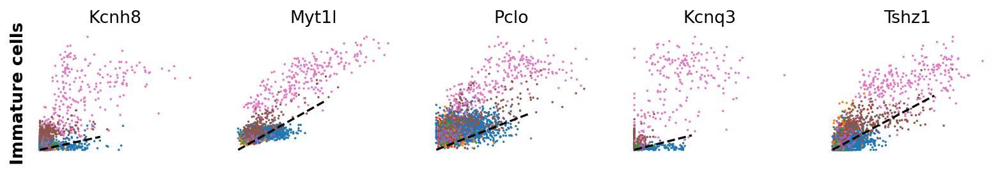

saving figure to file ./figures/scvelo_scatterplot_mature_cells.pdf


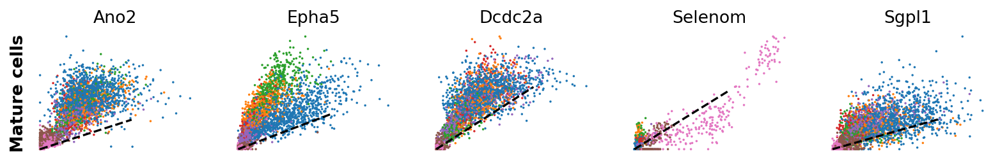

saving figure to file ./figures/scvelo_scatterplot_transition_cells.pdf


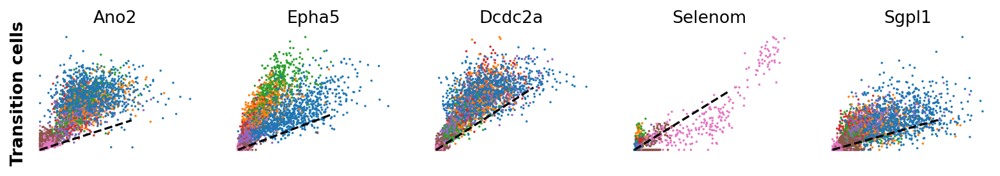

In [32]:
#Expressions of velocity genes
kwargs = dict(frameon=False, size=10, linewidth=1.5)

scv.pl.scatter(f, df['Immature cells'][:5], ylabel='Immature cells', **kwargs, save = 'scatterplot_Immature_cells.pdf')
scv.pl.scatter(f, df['Mature cells'][:5], ylabel='Mature cells', **kwargs, save = 'scatterplot_mature_cells.pdf')
scv.pl.scatter(f, df['Mature cells'][:5], ylabel='Transition cells', **kwargs, save = 'scatterplot_transition_cells.pdf')


VELOCITIES IN CYCLING PROGENITOR

calculating cell cycle phase
-->     'S_score' and 'G2M_score', scores of cell cycle phases (adata.obs)
saving figure to file ./figures/scvelo_cell-score.pdf


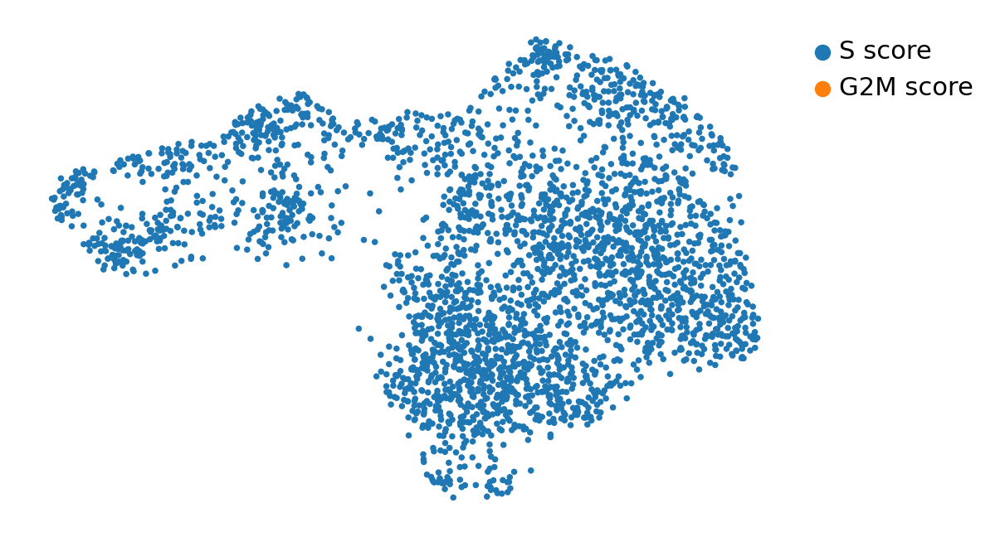

In [33]:
scv.tl.score_genes_cell_cycle(f)
scv.pl.scatter(f, color_gradients=['S_score', 'G2M_score' ], perc=[5, 95], save = 'cell-score.pdf')

saving figure to file ./figures/scvelo_Cell_cycle_genes.pdf


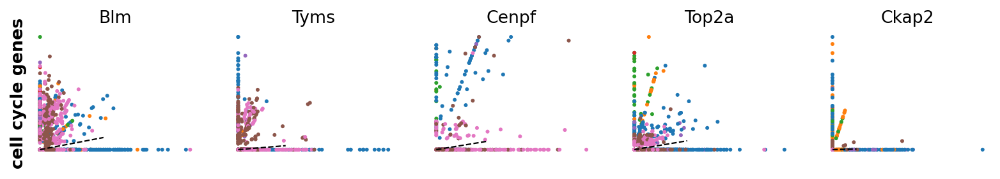

In [34]:
s_genes, g2m_genes = scv.utils.get_phase_marker_genes(f)
s_genes = scv.get_df(f[:, s_genes], 'spearmans_score', sort_values=True).index
g2m_genes = scv.get_df(f[:, g2m_genes], 'spearmans_score', sort_values=True).index

kwargs = dict(frameon=False, ylabel='cell cycle genes')
scv.pl.scatter(f, list(s_genes[:2]) + list(g2m_genes[:3]) ,**kwargs, save = 'Cell_cycle_genes.pdf')

saving figure to file ./figures/scvelo_Velocitygraph_Immature_cell.pdf


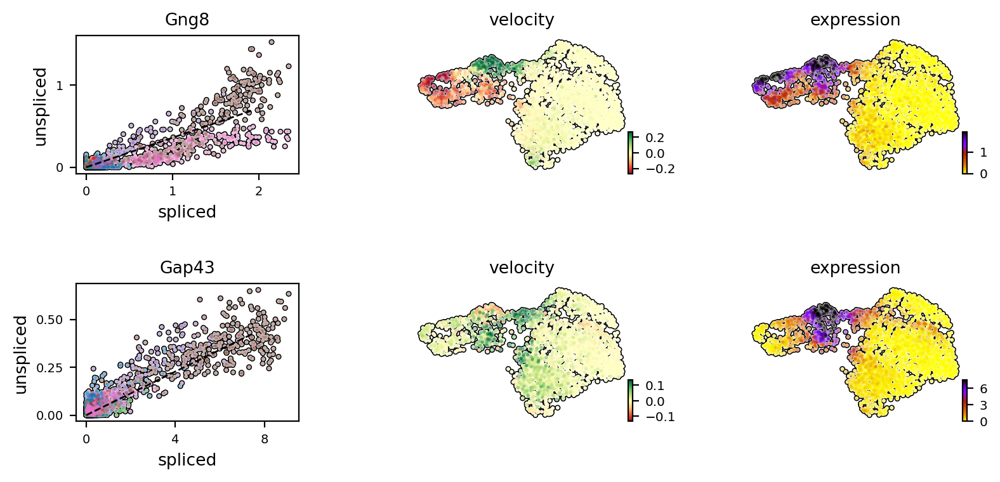

saving figure to file ./figures/scvelo_Velocitygraph_mature_cell.pdf


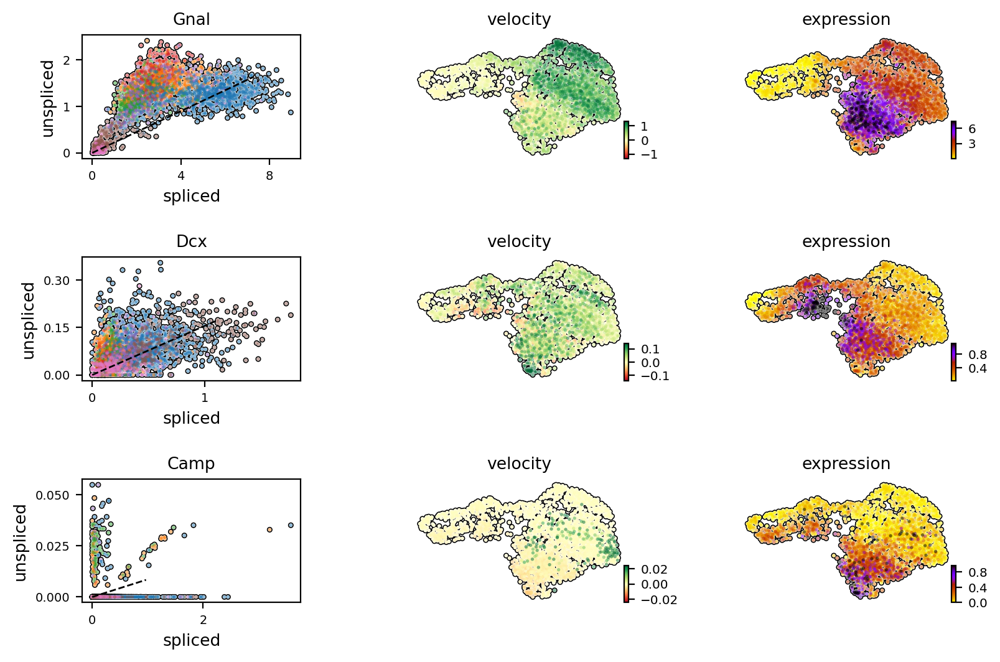

In [49]:
scv.pl.velocity(f, ['Gng8', 'Gap43', 'Ctxn3'], add_outline=True, save= 'Velocitygraph_Immature_cell.pdf')
scv.pl.velocity(f, ['Gnal', 'Dcx', 'Camp'], add_outline = True, save= 'Velocitygraph_mature_cell.pdf')

SPEED AND COHERENCE

In [52]:
f

AnnData object with n_obs × n_vars = 3093 × 2000
    obs: 'batch', 'cluster', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'CellID', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'louvain', 'celltype', 'S_score', 'G2M_score', 'phase', 'clusters_gradients'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'Gene', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'velocity_gamma', 'velocity_r2', 'velocity_genes', 'spearmans_score', 'velocity_score'
    uns: 'pca', 'neighbors', 'velocity_params', 'velocity_graph', 'velocity_graph_neg', 'umap', 'louvain', 'louvain_colors', 'cluster_colors', 'celltype_colors', 'rank_velocity_genes', 'clusters_gradients_colors'
    obsm: 'X_pca', 'X_umap', 'velocity_umap'
    varm: 'PCs'
    layers: 'matrix', 'ambiguous', 'sp

In [35]:
scv.tl.velocity_confidence(f)

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


saving figure to file ./figures/scvelo_speed_and_coherence.pdf


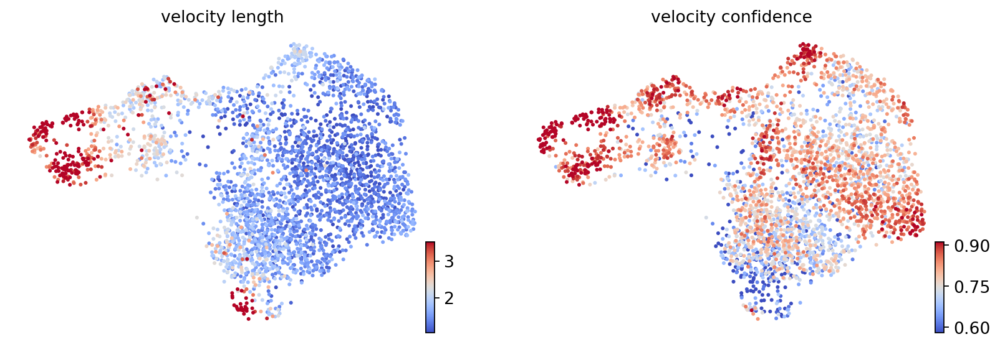

In [36]:
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(f, c=keys, cmap='coolwarm', perc=[5, 95], color = 'celltype', save = 'speed_and_coherence.pdf')

In [37]:
df = f.obs.groupby('celltype')[keys].mean().T
df.style.background_gradient(cmap='coolwarm', axis=1)

celltype,Immature cells,Mature cells,Transition cells
velocity_length,2.801533,1.531133,1.617143
velocity_confidence,0.842543,0.749831,0.779343


In [53]:
df.to_csv('velocity_data.csv')

VELOCITY GRAPH AND PSEUDOTIME

saving figure to file ./figures/scvelo_Velocity_graph.pdf


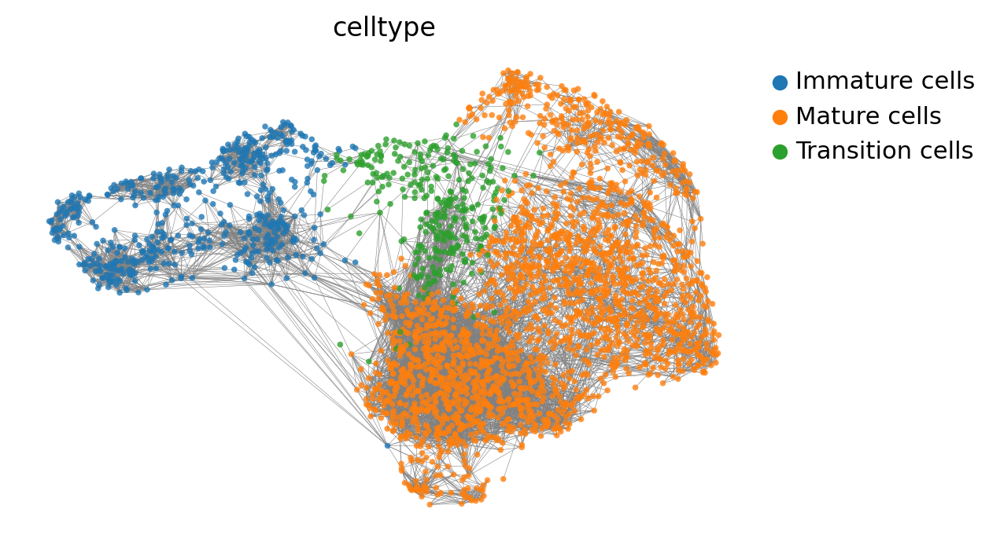

In [38]:
scv.pl.velocity_graph(f, threshold=.1, color='celltype', save = 'Velocity_graph.pdf')

saving figure to file ./figures/scvelo_descendants-ancestor-cell.pdf


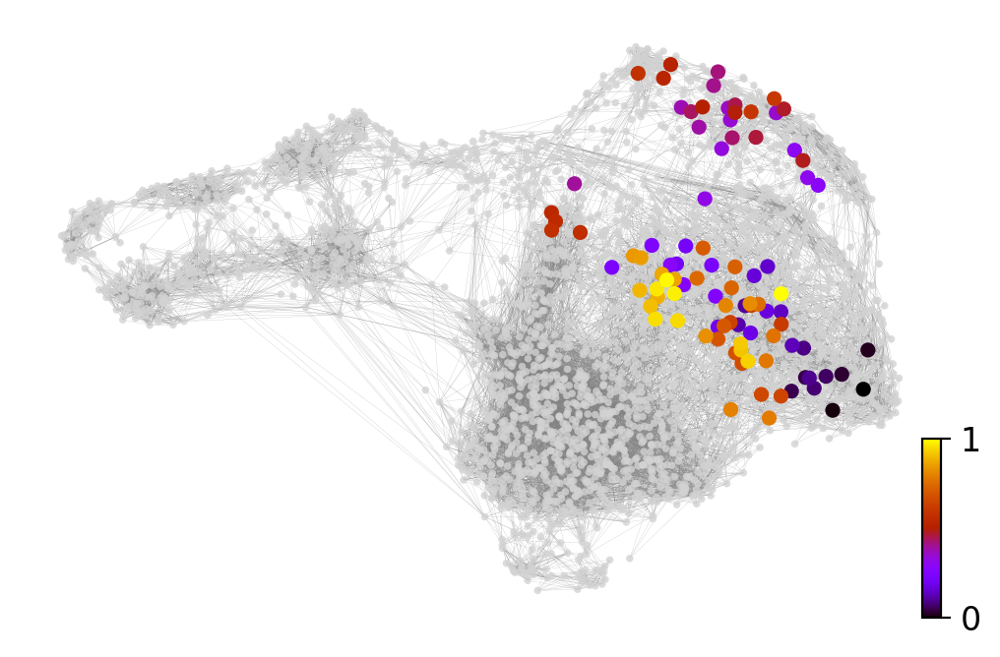

In [39]:
x, y = scv.utils.get_cell_transitions(f, basis='umap', starting_cell= 100)
ax = scv.pl.velocity_graph(f, c='lightgrey', edge_width=.05, show=False)
ax = scv.pl.scatter(f, x=x, y=y, s=120, c='ascending', cmap='gnuplot', ax=ax, save='descendants-ancestor-cell.pdf')

computing terminal states
    identified 1 region of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
saving figure to file ./figures/scvelo_pseudotime.pdf


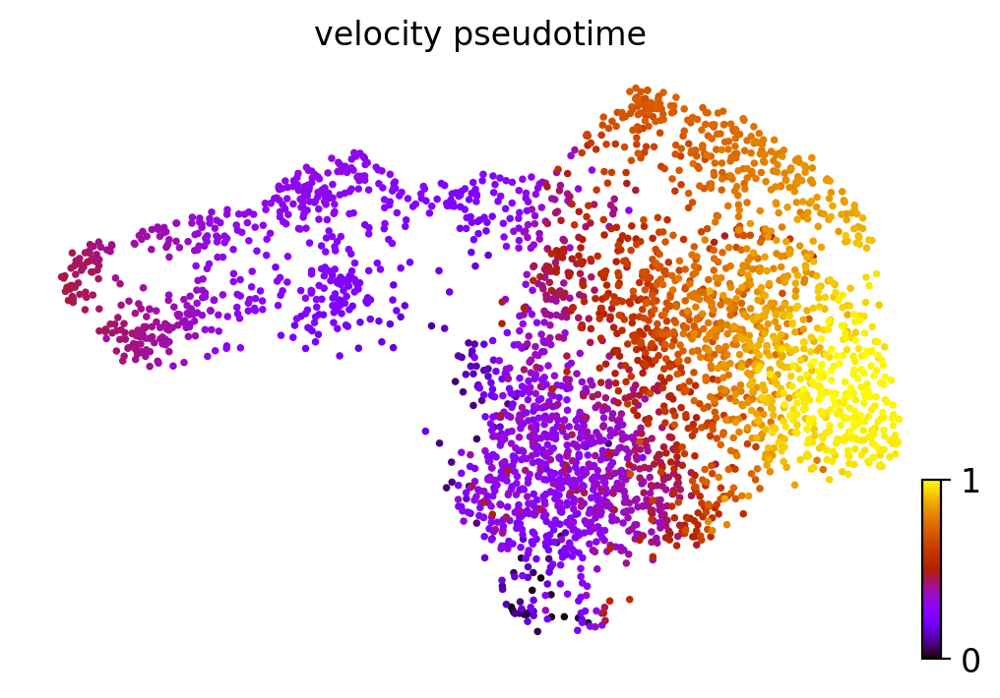

In [40]:
scv.tl.velocity_pseudotime(f)
scv.pl.scatter(f, color='velocity_pseudotime', cmap='gnuplot', save = 'pseudotime.pdf')

PAGA VELOCITY GRAPH

In [41]:
f.uns['neighbors']['distances'] = f.obsp['distances']
f.uns['neighbors']['connectivities'] = f.obsp['connectivities']
scv.tl.paga(f, groups='celltype')
df = scv.get_df(f, 'paga/transitions_confidence', precision=2).T
df.style.background_gradient(cmap='Blues').format('{:.2g}')

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:00) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


,0,1,2
0,0,0,0.052
1,0,0,0
2,0,0.29,0


saving figure to file ./figures/scvelo_PAGA.pdf


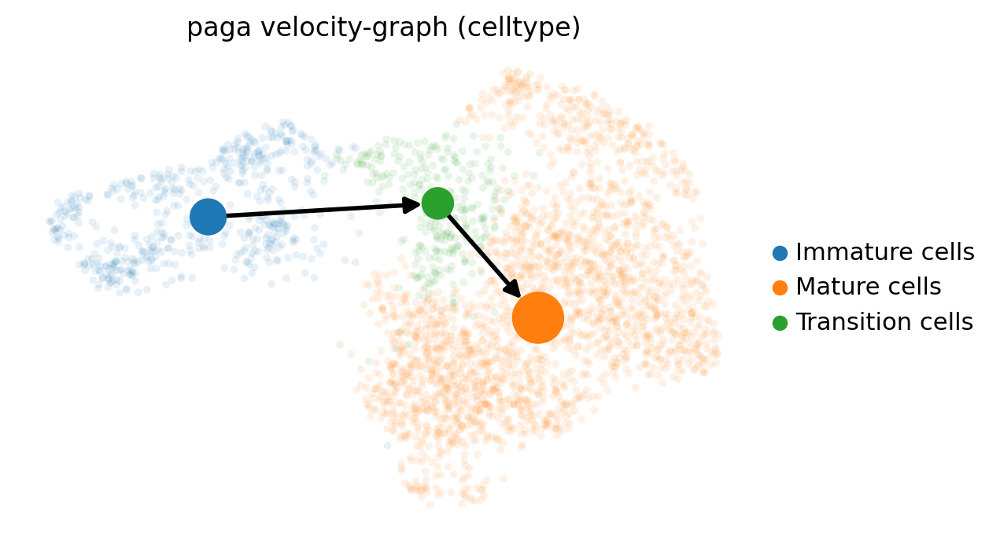

In [42]:
scv.pl.paga(f, basis='umap', size=50, alpha=.1,
            min_edge_width=2, node_size_scale=1.5, save = 'PAGA.pdf')

# Dynamical modeling

In [43]:
scv.tl.recover_dynamics(f)

recovering dynamics
    finished (0:02:42) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


In [44]:
scv.tl.velocity(f, mode='dynamical')
scv.tl.velocity_graph(f)

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:01) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file ./figures/scvelo_differential_velocity_stream.pdf


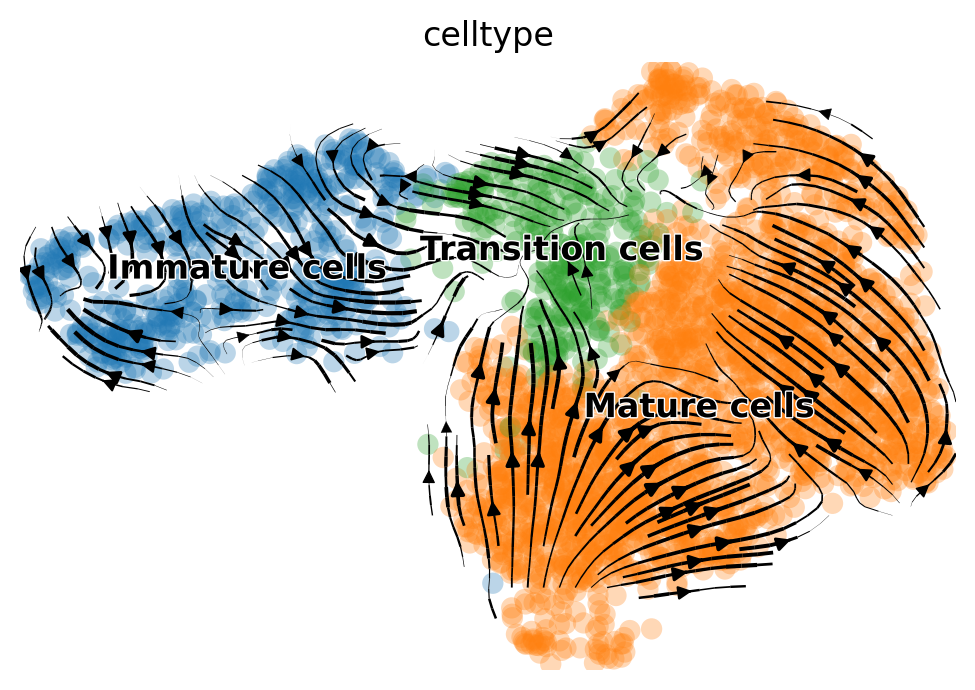

In [45]:
scv.pl.velocity_embedding_stream(f, basis='umap', color = 'celltype', save = 'differential_velocity_stream.pdf')

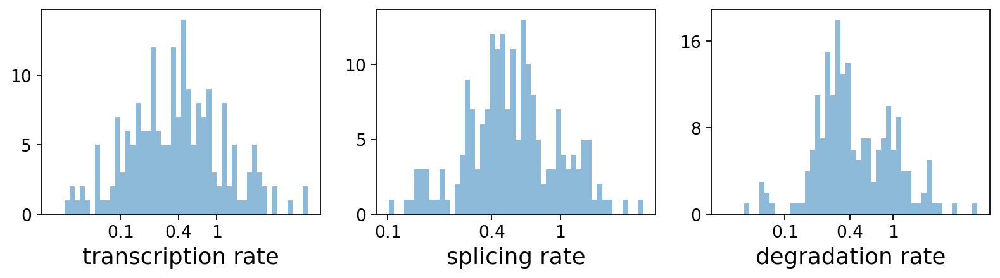

,fit_alpha,fit_beta,fit_gamma,fit_t_,fit_scaling,fit_std_u,fit_std_s,fit_likelihood,fit_u0,fit_s0,fit_pval_steady,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling,fit_r2
Sphkap,0.03,0.14,0.05,20.94,1.45,9.32e-02,0.11,0.01,0.0,0.0,0.35,0.18,0.25,0.36,8.75,0.10
Kcnj13,0.56,25.98,2.71,7.52,0.03,3.73e-03,0.06,0.03,0.0,0.0,0.26,0.02,0.15,0.69,0.59,0.06
Olfr1414,0.12,1.58,0.24,9.51,0.16,1.69e-02,0.11,0.23,0.0,0.0,0.34,0.06,0.41,0.43,3.40,0.81
Cd55,0.18,2.25,0.28,6.89,0.23,2.85e-02,0.15,0.21,0.0,0.0,0.35,0.08,0.43,1.14,2.31,0.32
Pcp4l1,2.81,9.33,0.33,8.66,0.05,7.56e-02,2.25,0.27,0.0,0.0,0.49,0.22,5.47,0.60,2.74,0.32


In [56]:
df = f.var
df = df[(df['fit_likelihood'] > .1) & df['velocity_genes'] == True]
kwargs = dict(xscale='log', fontsize=16)
with scv.GridSpec(ncols=3) as pl:
    pl.hist(df['fit_alpha'], xlabel='transcription rate',xticks=[.1, .4, 1], **kwargs)
    pl.hist(df['fit_beta'] * df['fit_scaling'], xlabel='splicing rate', xticks=[.1, .4, 1], **kwargs)
    pl.hist(df['fit_gamma'], xlabel='degradation rate', xticks=[.1, .4, 1], **kwargs)
    plt.savefig('trans-spl-deg.pdf')

scv.get_df(f, 'fit*', dropna=True).head()

In [71]:
df.to_csv('trans-spli-degr-wild.csv')

computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)
saving figure to file ./figures/scvelo_Latent_time.pdf


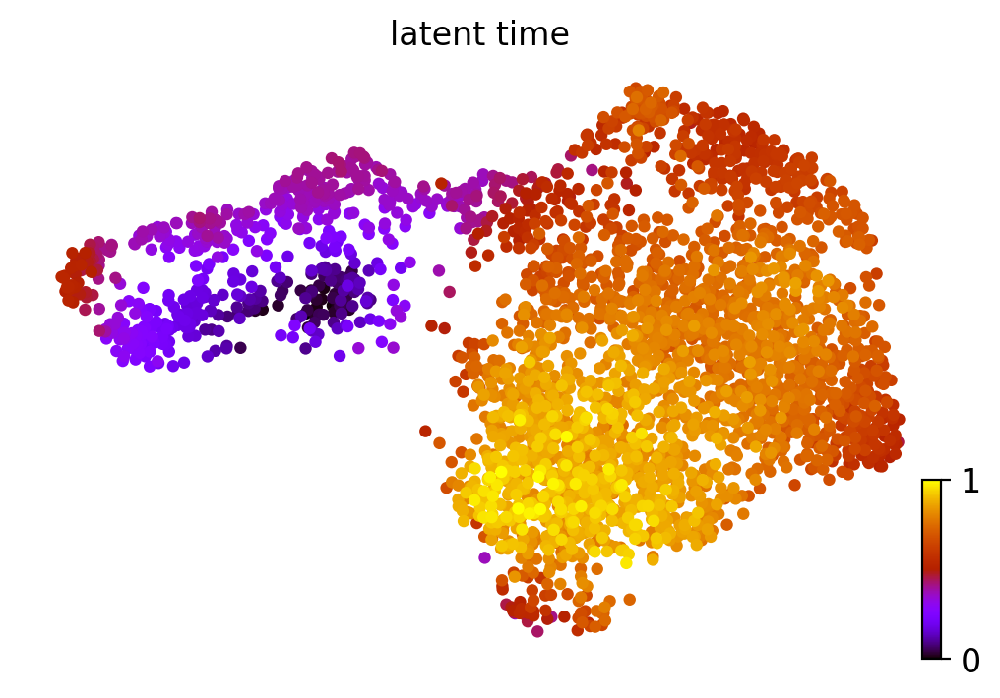

In [72]:
scv.tl.latent_time(f)
scv.pl.scatter(f, color='latent_time', color_map='gnuplot', size=80, save = 'Latent_time.pdf')

saving figure to file ./figures/scvelo_heatmap_Toplikelihoodgenes_heatmap.pdf


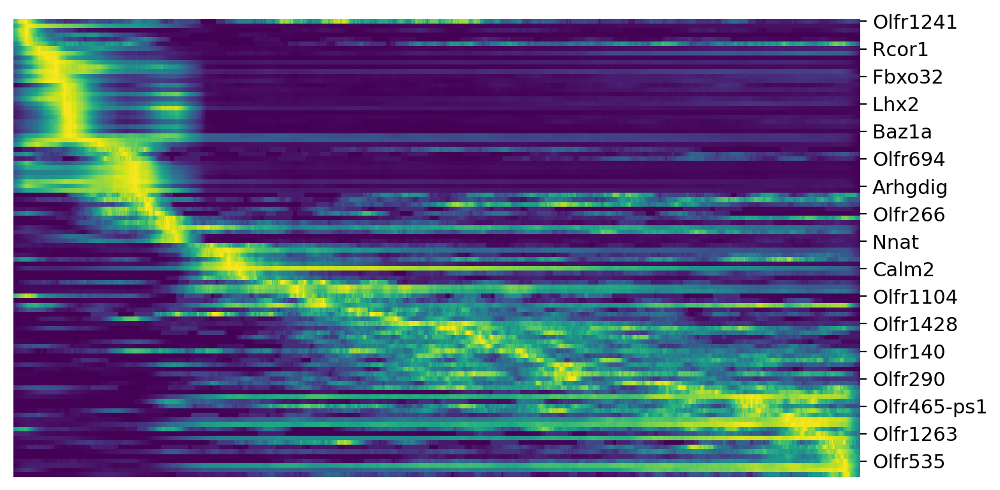

In [75]:
top_genes = f.var['fit_likelihood'].sort_values(ascending=False).index[:100]
scv.pl.heatmap(f, var_names=top_genes, sortby='latent_time', n_convolve=100, save = 'Toplikelihoodgenes_heatmap.pdf')

TOP LIKELIHOOD GENES - DRIVER GENES

saving figure to file ./figures/scvelo_toplikelihood-15genes_scatterplot.pdf


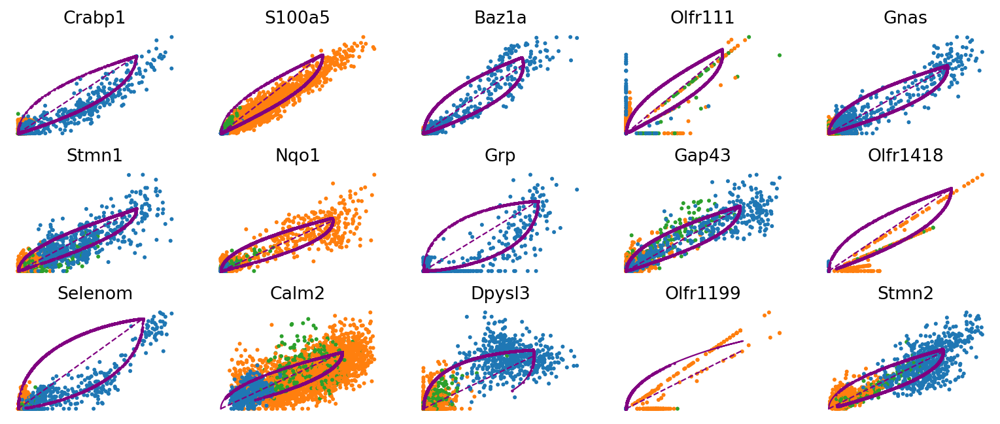

In [77]:
top_genes = f.var['fit_likelihood'].sort_values(ascending=False).index
scv.pl.scatter(f, basis=top_genes[:15], ncols=5, frameon=False, color = 'celltype',save = 'toplikelihood-15genes_scatterplot')

CLUSTER SPECIFIC TOP LIKELIHOOD GENES

In [78]:
scv.tl.rank_dynamical_genes(f, groupby='celltype')
df = scv.get_df(f, 'rank_dynamical_genes/names')
df.head(5)

ranking genes by cluster-specific likelihoods
    finished (0:00:01) --> added 
    'rank_dynamical_genes', sorted scores by group ids (adata.uns)


,Immature cells,Mature cells,Transition cells
0,Crabp1,S100a5,Olfr1213
1,Grp,Calm2,Gap43
2,Selenom,Dcdc2a,Cartpt
3,Baz1a,Ano2,Stmn2
4,Gnas,Cartpt,Olfr299


In [79]:
df.to_csv('rank_dynamical_genes.csv')

saving figure to file ./figures/scvelo_cluster-specific_likelihood_genes{x}Immature cells.pdf


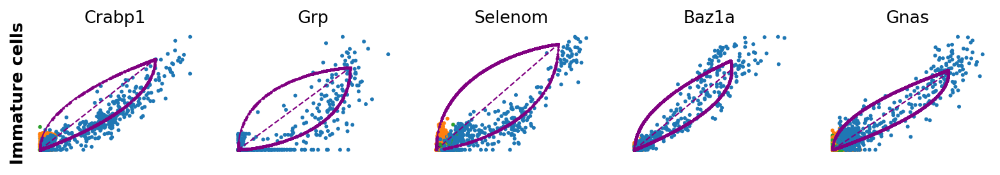

saving figure to file ./figures/scvelo_cluster-specific_likelihood_genes{x}Mature cells.pdf


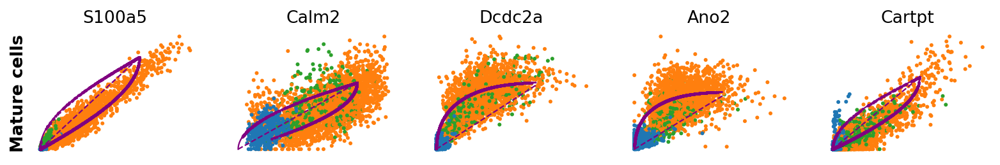

In [80]:
for cluster in ['Immature cells', 'Mature cells']:
    scv.pl.scatter(f, df[cluster][:5], ylabel=cluster, frameon=False, color = 'celltype', save= 'cluster-specific_likelihood_genes{x}'+cluster)


# CELL RANK

In [81]:
cr.tl.terminal_states(f, weight_connectivities=0.2,cluster_key='celltype')

  0%|          | 0/3093 [00:00<?, ?cell/s]

  0%|          | 0/3093 [00:00<?, ?cell/s]

Unable to import PETSc or SLEPc.
You can install it from: https://slepc4py.readthedocs.io/en/stable/install.html
Defaulting to `method='brandts'`.
INFO: Using pre-computed schur decomposition


saving figure to file ./figures/scvelo_cellrank_Terminalstates.pdf


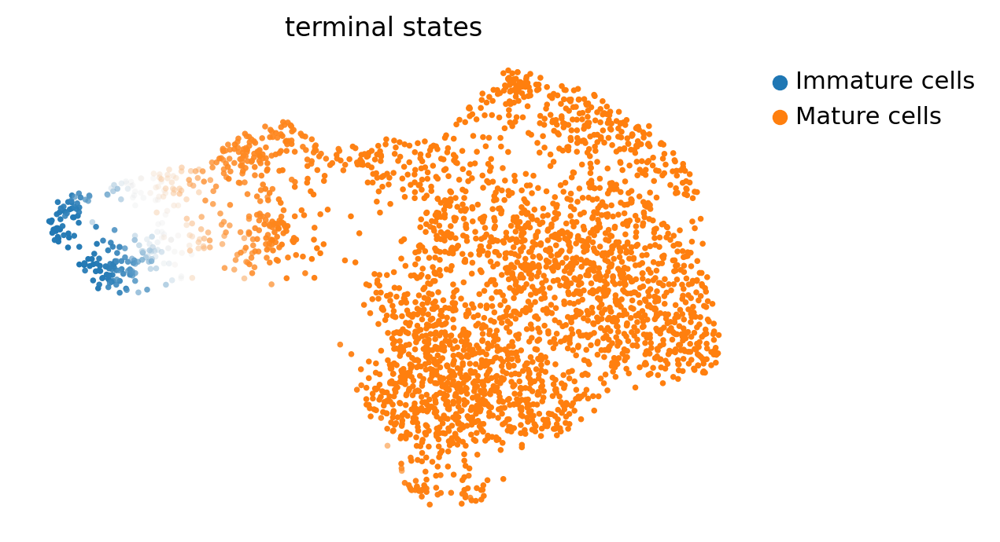

In [82]:
cr.pl.terminal_states(f, cluster_key='celltype', save = 'cellrank_Terminalstates.pdf')

  0%|          | 0/3093 [00:00<?, ?cell/s]

  0%|          | 0/3093 [00:00<?, ?cell/s]

INFO: Using pre-computed schur decomposition
saving figure to file ./figures/scvelo_cellrank_initialstates.pdf


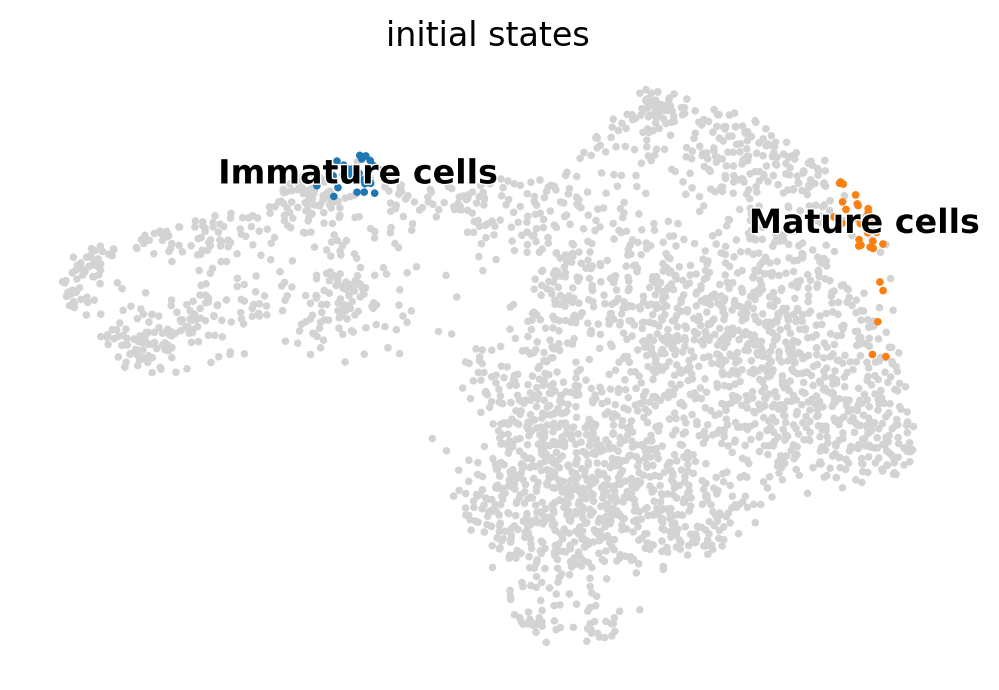

In [83]:
cr.tl.initial_states(f, cluster_key='celltype')
cr.pl.initial_states(f, discrete=True, save = 'cellrank_initialstates.pdf')

saving figure to file ./figures/scvelo_cellrank_lineages.pdf


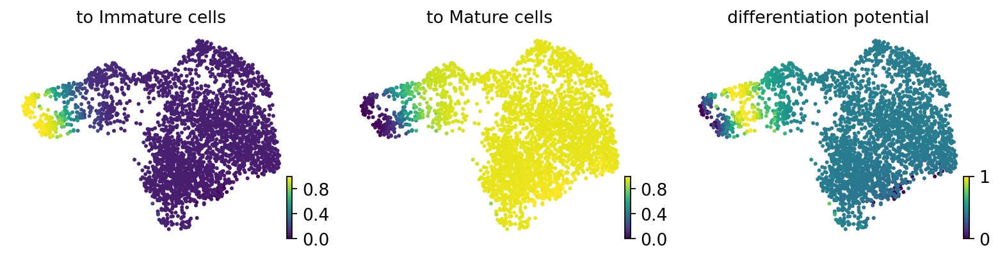

In [130]:
cr.tl.lineages(f)
cr.pl.lineages(f, same_plot=False,rescale_color = [0,1], save = 'cellrank_lineages.pdf')

In [87]:
scv.tl.latent_time(f, root_key= 'initial_state_probs', end_key='terminal_states_probs')

computing latent time using root_cells, terminal_states_probs as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


In [88]:
scv.tl.paga(f, groups='celltype', root_key='initial_state_probs', end_key='terminal_states_probs',
            use_time_prior='velocity_pseudotime')

running PAGA using priors: ['velocity_pseudotime', 'terminal_states_probs']
    finished (0:00:01) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


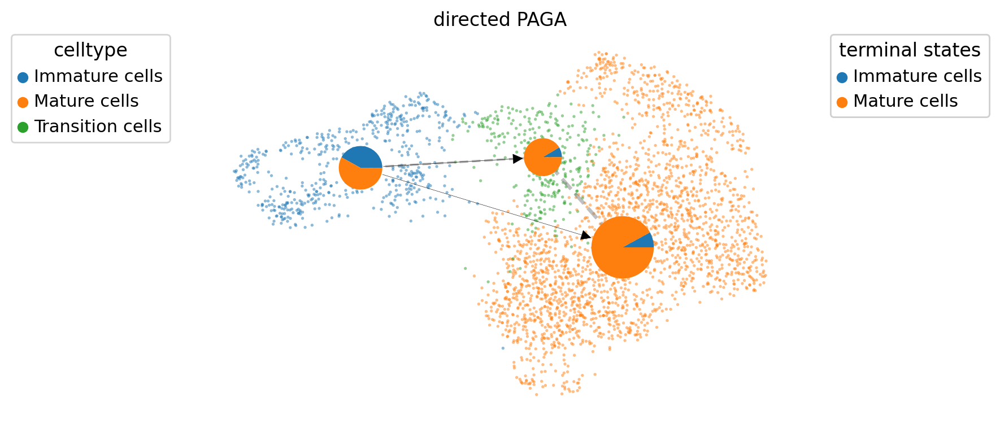

In [89]:
cr.pl.cluster_fates(f, mode="paga_pie", cluster_key="celltype", basis='umap', 
                    legend_kwargs={'loc': 'top right out'}, legend_loc='top left out', 
                    node_size_scale=5, edge_width_scale=1, max_edge_width=4, title='directed PAGA', save = 'Cellrank-Differential_PAGA.pdf')

In [90]:
cr.tl.lineage_drivers(f)

,Immature cells corr,Immature cells pval,Immature cells qval,Immature cells ci low,Immature cells ci high,Mature cells corr,Mature cells pval,Mature cells qval,Mature cells ci low,Mature cells ci high
Sox11,0.75,0.00e+00,0.00e+00,0.73,0.76,-0.75,0.00e+00,0.00e+00,-0.76,-0.73
Baz1a,0.74,0.00e+00,0.00e+00,0.73,0.76,-0.74,0.00e+00,0.00e+00,-0.76,-0.73
Crabp1,0.71,0.00e+00,0.00e+00,0.69,0.73,-0.71,0.00e+00,0.00e+00,-0.73,-0.69
Selenom,0.66,0.00e+00,0.00e+00,0.64,0.68,-0.66,0.00e+00,0.00e+00,-0.68,-0.64
Nhlh2,0.66,0.00e+00,0.00e+00,0.64,0.68,-0.66,0.00e+00,0.00e+00,-0.68,-0.64
...,...,...,...,...,...,...,...,...,...,...
Fstl5,-0.32,1.32e-74,5.63e-73,-0.35,-0.29,0.32,1.32e-74,5.63e-73,0.29,0.35
Ckb,-0.32,1.15e-76,5.00e-75,-0.35,-0.29,0.32,1.15e-76,5.00e-75,0.29,0.35
Calm2,-0.33,7.37e-81,3.28e-79,-0.36,-0.30,0.33,7.37e-81,3.28e-79,0.30,0.36
S100a5,-0.34,7.07e-89,3.37e-87,-0.38,-0.31,0.34,7.07e-89,3.37e-87,0.31,0.38


saving figure to file ./figures/scvelo_lineage drivers.pdf


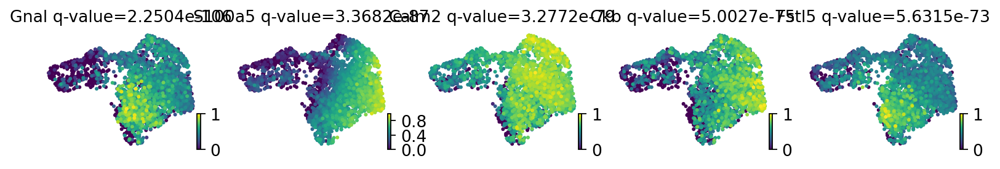

In [92]:
cr.pl.lineage_drivers(f, lineage="Mature cells", n_genes=5, rescale_color = [0,1], save = 'lineage drivers.pdf')

In [93]:
root_idx = np.where(f.obs['celltype'] == 'Immature cells')[0][0]

In [94]:
f.uns['iroot'] = root_idx

In [95]:
scp.tl.dpt(f)

saving figure to file ./figures/scvelo_cellrank_combinedgraph.pdf


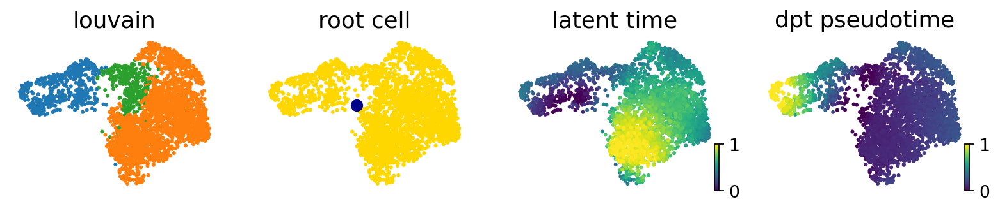

In [96]:
# compue dpt, starting from CellRank defined root cell
scv.pl.scatter(f, color=['celltype', root_idx, 'latent_time', 'dpt_pseudotime'], fontsize=16,
               cmap='viridis', perc=[2, 98], colorbar=True, rescale_color=[0, 1],
               title=['louvain', 'root cell', 'latent time', 'dpt pseudotime'], save = 'cellrank_combinedgraph.pdf')

In [97]:
model = cr.ul.models.GAM(f)

  0%|          | 0/2 [00:00<?, ?gene/s]

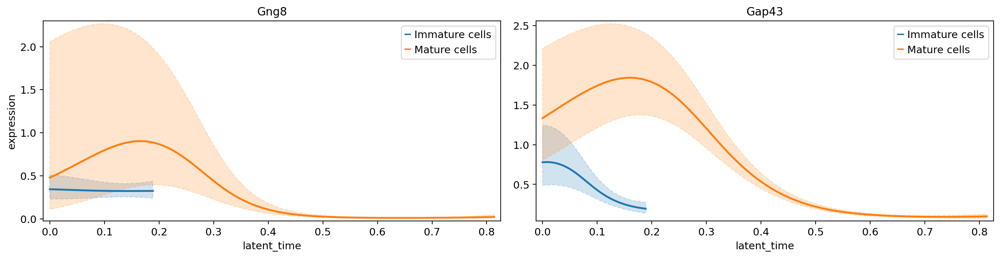

In [98]:
cr.pl.gene_trends(f, model=model, data_key='X',
                  genes=['Gng8', 'Gap43'], ncols=2,
                  time_key='latent_time', same_plot=True, hide_cells=True,
                  figsize=(15, 4), n_test_points=200)

ADVANCE

In [99]:
from cellrank.tl.kernels import VelocityKernel
vk = VelocityKernel(f)

In [100]:
vk.compute_transition_matrix()

  0%|          | 0/3093 [00:00<?, ?cell/s]

  0%|          | 0/3093 [00:00<?, ?cell/s]

<Velo>

In [101]:
from cellrank.tl.kernels import ConnectivityKernel
ck = ConnectivityKernel(f).compute_transition_matrix()

In [102]:
combined_kernel = 0.8 * vk + 0.2 * ck
root_idx = np.where(f.obs['celltype'] == 'Immature cells')[0][0]
f.uns['iroot'] = root_idx


In [103]:
from cellrank.tl.kernels import PalantirKernel
pk = PalantirKernel(f, time_key='dpt_pseudotime').compute_transition_matrix()
print(pk)

<Pala[k=3, dnorm=True, n_neighs=30]>


In [104]:
from cellrank.tl.estimators import GPCCA
g = GPCCA(combined_kernel)
print(g)

GPCCA[n=3093, kernel=((0.8 * <Velo[softmax_scale=5.7, mode=deterministic, seed=46458, scheme=<CorrelationScheme>]>) + (0.2 * <Conn[dnorm=True]>))]


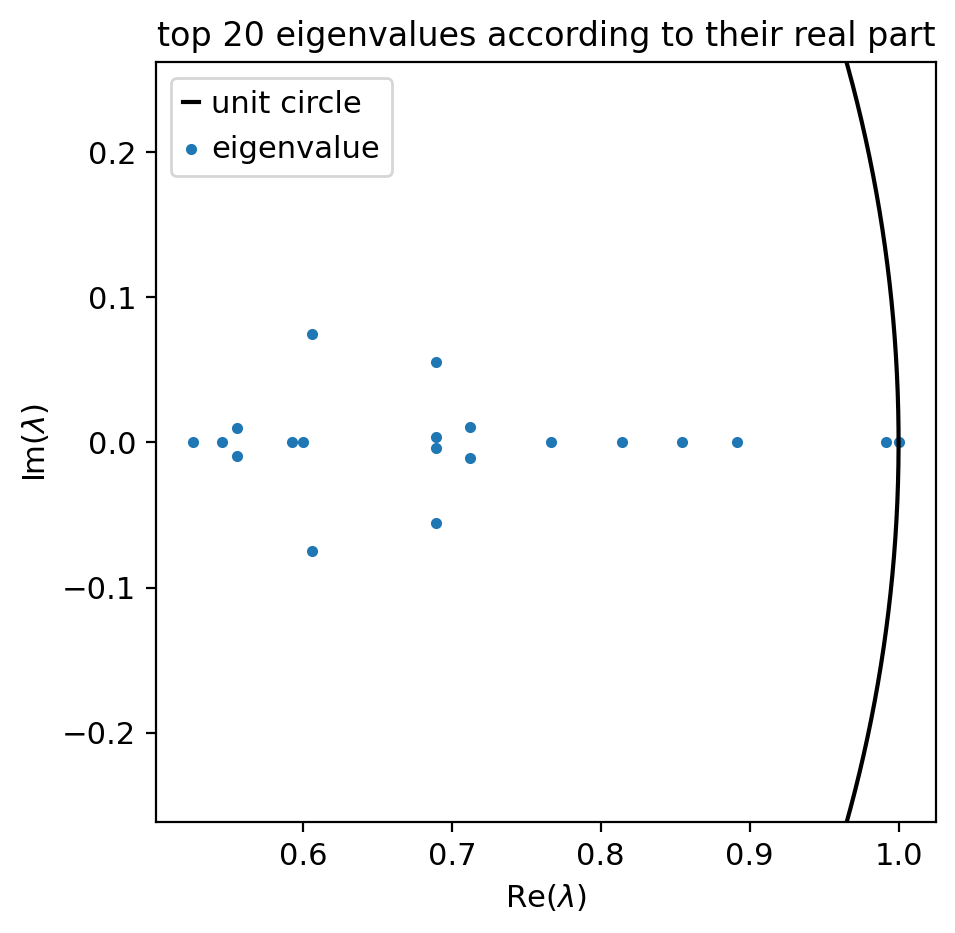

In [105]:
g.compute_schur(n_components=20)
g.plot_spectrum(save='cellrank-eigenvalues.pdf')

saving figure to file ./figures/scvelo_cellrank-schurvector.pdf


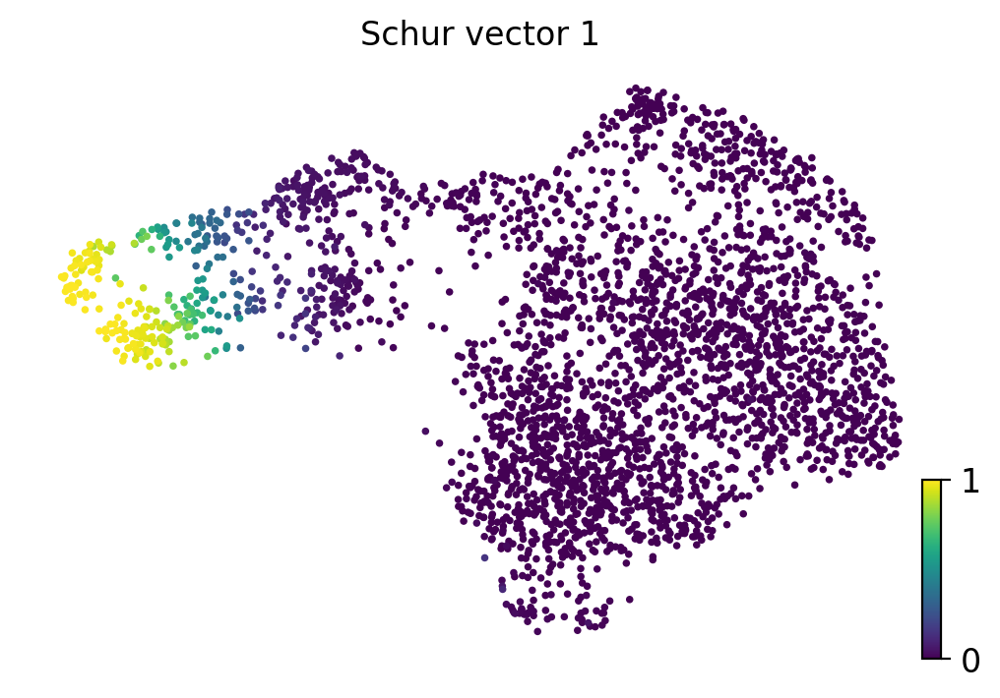

In [106]:
g.plot_schur(use=1, rescale_color = [0,1], save='cellrank-schurvector.pdf')

INFO: Using pre-computed schur decomposition
saving figure to file ./figures/scvelo_cellrank-macrostates.pdf


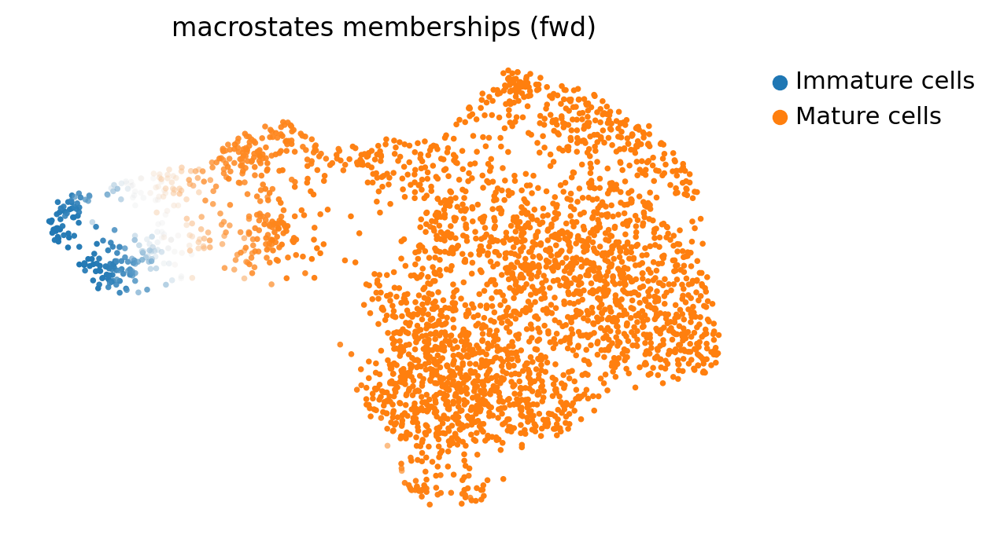

In [107]:
g.compute_macrostates(n_states=2, cluster_key='celltype')
g.plot_macrostates(save = 'cellrank-macrostates.pdf')

saving figure to file ./figures/scvelo_cellrank-macrostates-diff-plots.pdf


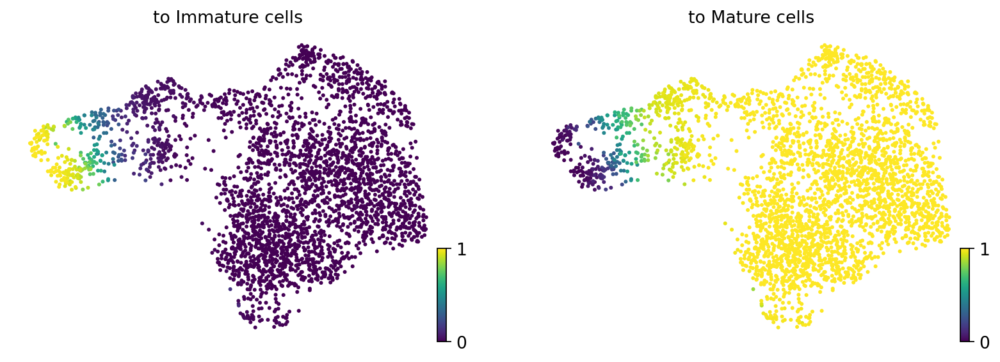

In [108]:
g.plot_macrostates(same_plot=False, rescale_color = [0,1], save = 'cellrank-macrostates-diff-plots.pdf')

saving figure to file ./figures/scvelo_cellrank_macrostates-forward.pdf


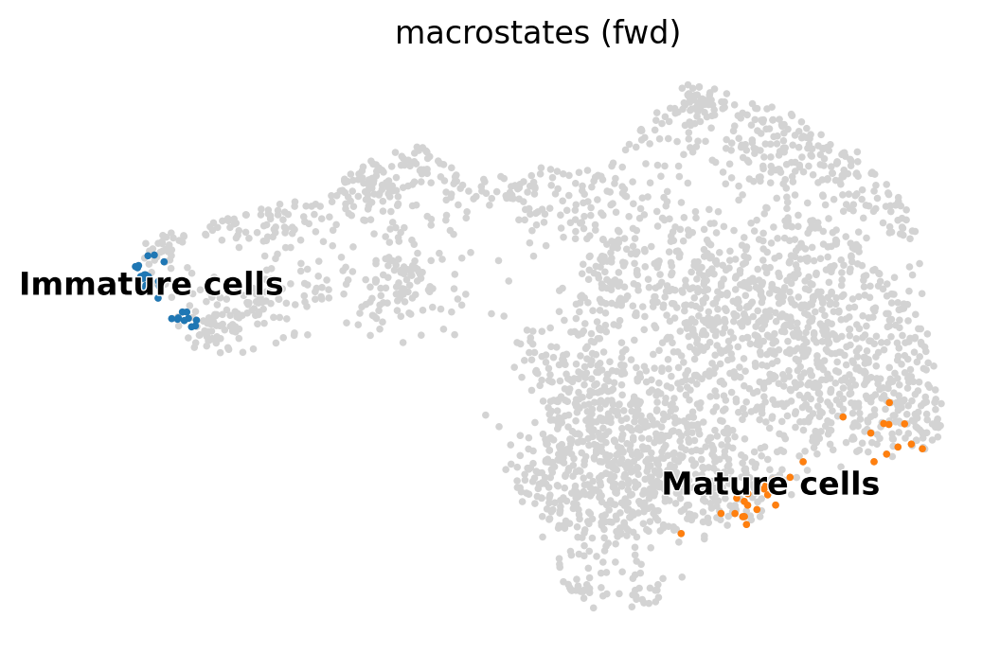

In [109]:
g.plot_macrostates(discrete=True, save = 'cellrank_macrostates-forward.pdf')

In [110]:
g.set_terminal_states_from_macrostates()

In [111]:
g.compute_absorption_probabilities()

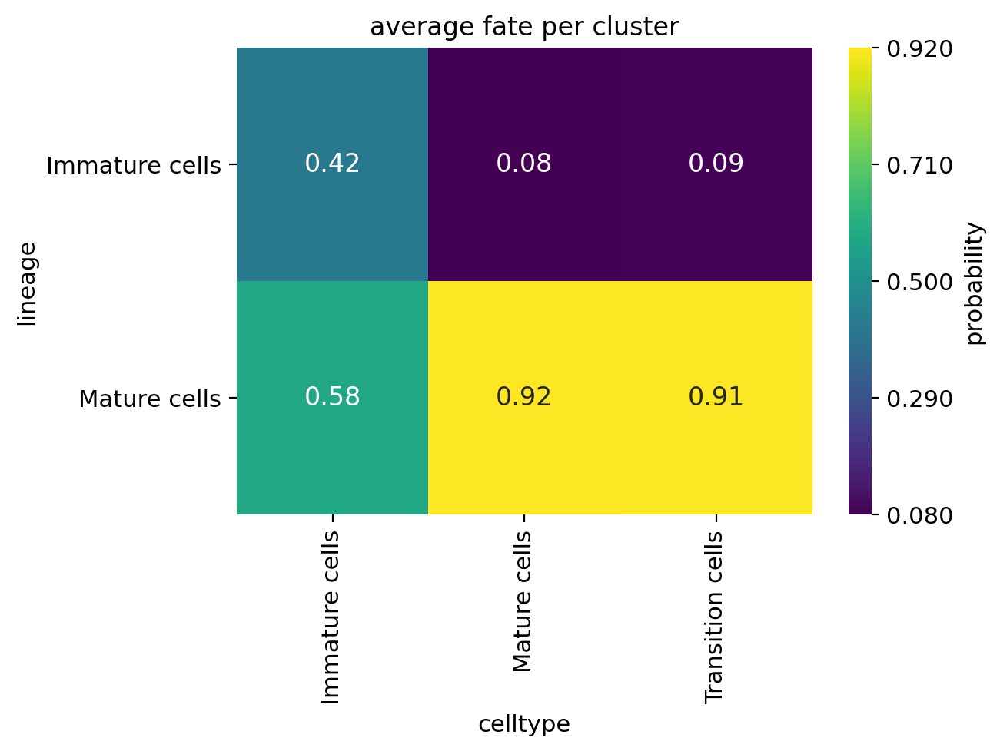

In [113]:
cr.pl.cluster_fates(f, cluster_key='celltype', mode='heatmap', save = 'cellrank-heatmap-clusterfate.pdf')

# Differential kinetics

In [114]:
scv.tl.differential_kinetic_test(f, groupby='celltype')


testing for differential kinetics
    finished (0:00:40) --> added 
    'fit_diff_kinetics', clusters displaying differential kinetics (adata.var)
    'fit_pval_kinetics', p-values of differential kinetics (adata.var)


In [115]:
var_names = ['Gap43', 'Gng8']

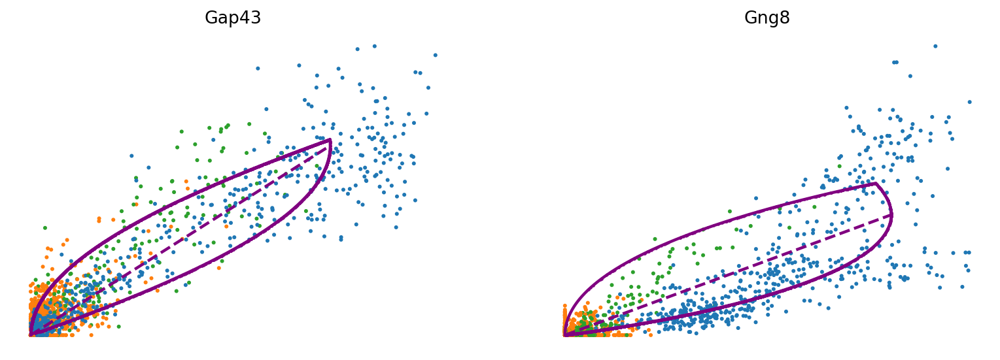

In [116]:
kwargs = dict(linewidth=2, add_linfit=True, frameon=False)
scv.pl.scatter(f, basis=var_names, add_outline='fit_diff_kinetics', **kwargs)

No handles with labels found to put in legend.


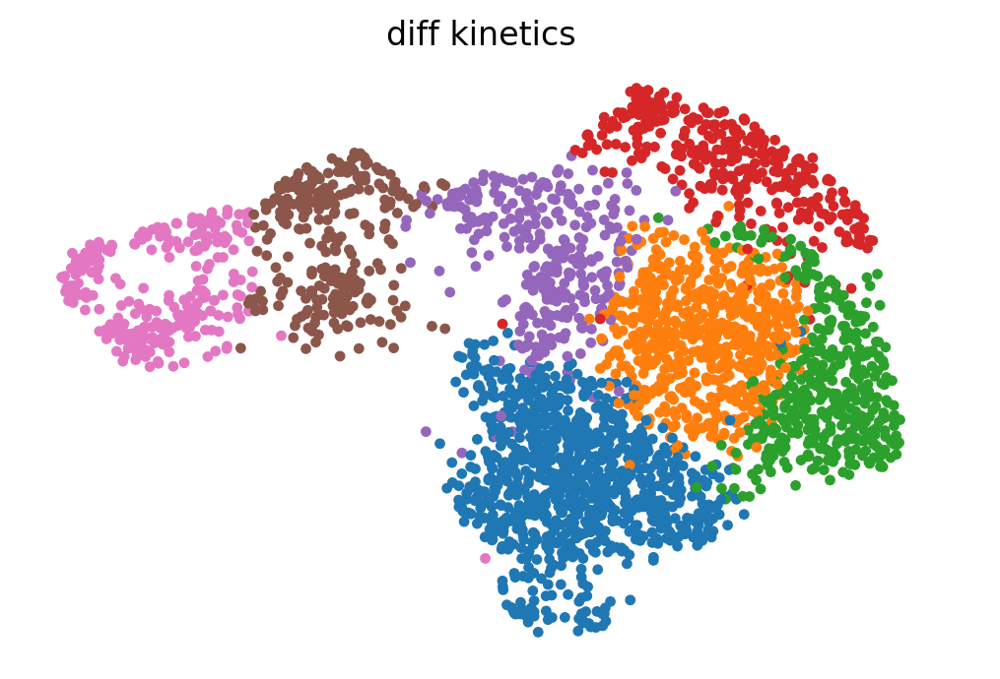

In [117]:
diff_clusters=list(f[:, var_names].var['fit_diff_kinetics'])
scv.pl.scatter(f, legend_loc='right', size=60, title='diff kinetics',
               add_outline=diff_clusters)


TOP LIKELIHOOD genes

In [118]:
scv.tl.recover_dynamics(f)


recovering dynamics
    finished (0:01:45) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


In [119]:
top_genes = f.var['fit_likelihood'].sort_values(ascending=False).index[:100]
scv.tl.differential_kinetic_test(f, groupby='celltype')

testing for differential kinetics
    finished (0:00:19) --> added 
    'fit_diff_kinetics', clusters displaying differential kinetics (adata.var)
    'fit_pval_kinetics', p-values of differential kinetics (adata.var)


saving figure to file ./figures/scvelo_differential-kinetics-15genes.pdf


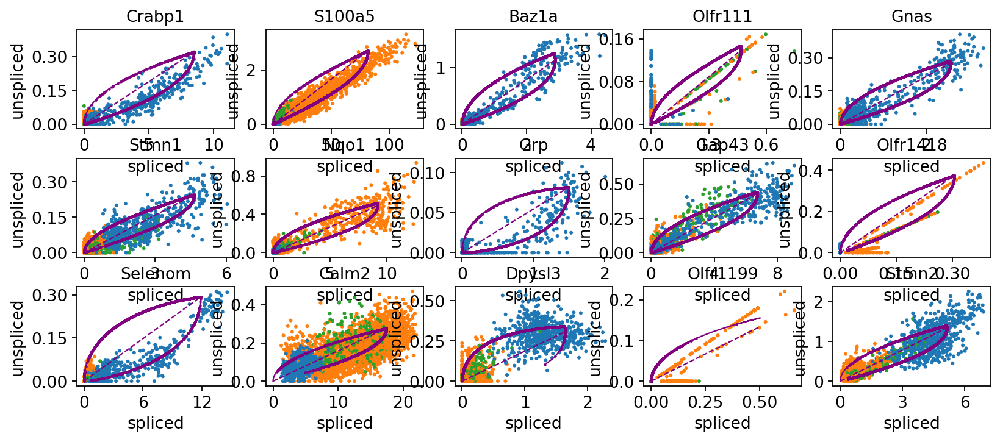

In [120]:
scv.pl.scatter(f, basis=top_genes[:15], ncols=5, add_outline='fit_diff_kinetics', save = 'differential-kinetics-15genes.pdf')

saving figure to file ./figures/scvelo_differential-kinetics-15-30genes.pdf


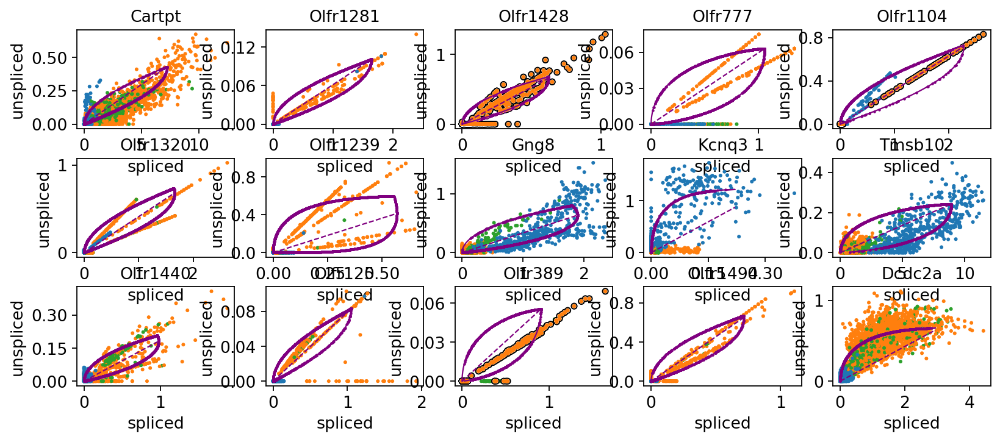

In [121]:
scv.pl.scatter(f, basis=top_genes[15:30], ncols=5, add_outline='fit_diff_kinetics', save = 'differential-kinetics-15-30genes.pdf')

RECOMPUTING VELOCITIES

In [122]:
scv.tl.velocity(f, diff_kinetics=True, groupby='celltype')
scv.tl.velocity_graph(f)

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:02) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file ./figures/scvelo_differential-velocity.pdf


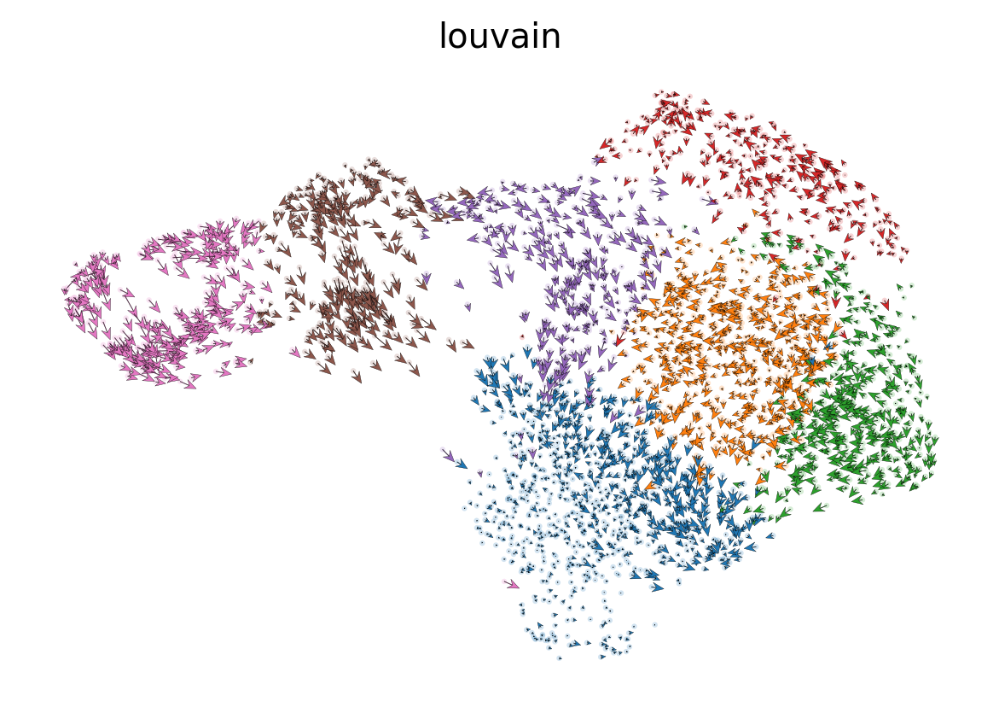

In [123]:
scv.pl.velocity_embedding(f, dpi=120, arrow_size=2, arrow_length=2, save = 'differential-velocity.pdf')

DGE

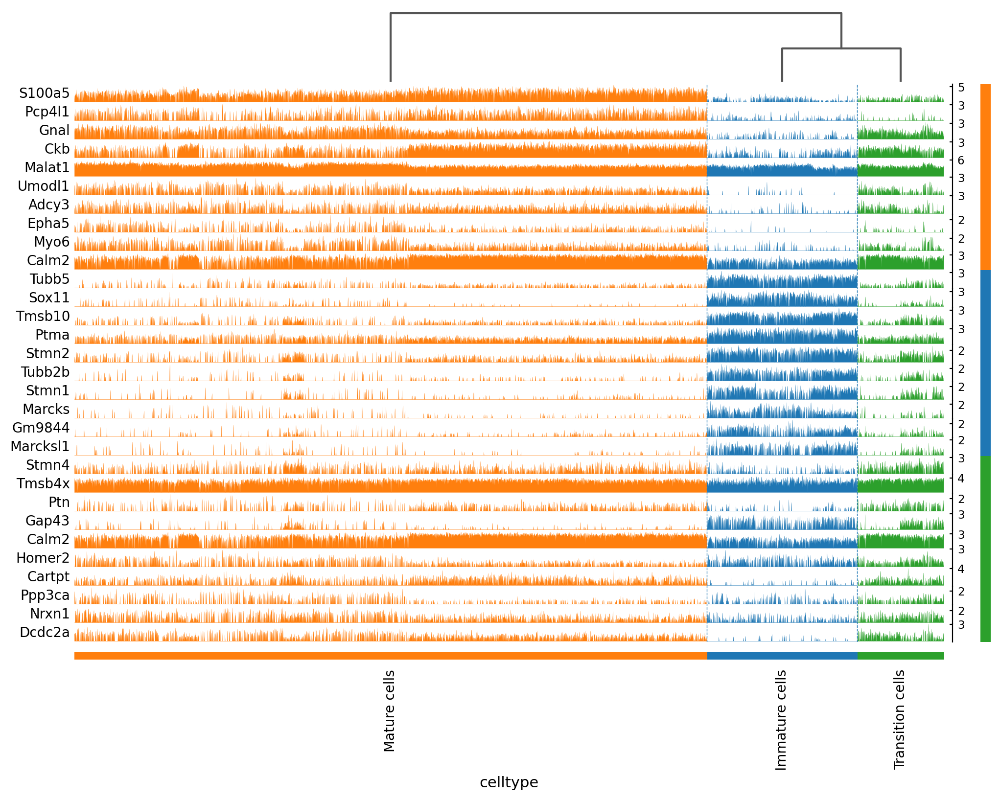

In [124]:
scp.tl.rank_genes_groups(f, groupby='celltype', use_raw=True, 
                        method='t-test_overestim_var', n_genes=10) # compute differential expression
scp.pl.rank_genes_groups_tracksplot(f, groupby='celltype', save = 'differentialexp.pdf')

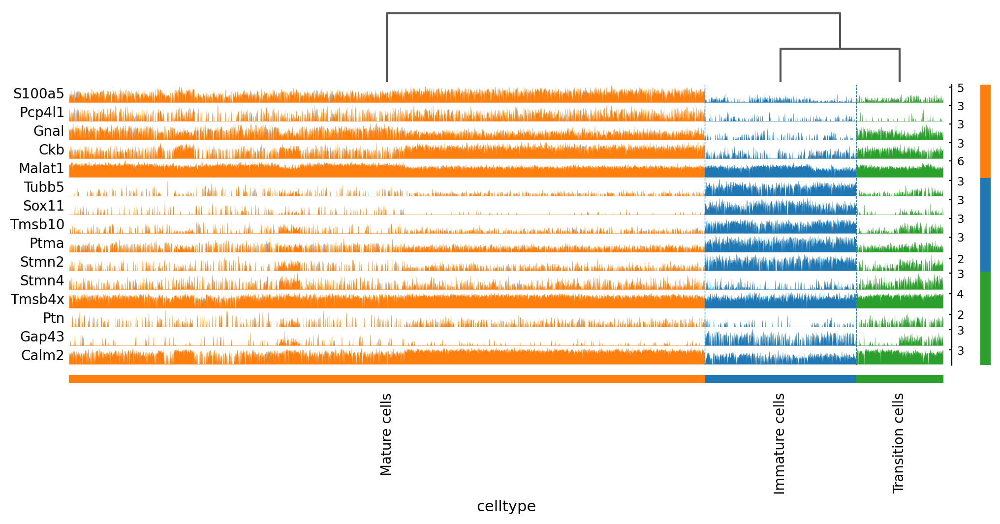

In [125]:
scp.tl.rank_genes_groups(f, groupby='celltype', use_raw=True, 
                        method='t-test_overestim_var', n_genes=5) # compute differential expression
scp.pl.rank_genes_groups_tracksplot(f, groupby='celltype', save = 'diffexp5genes.pdf')

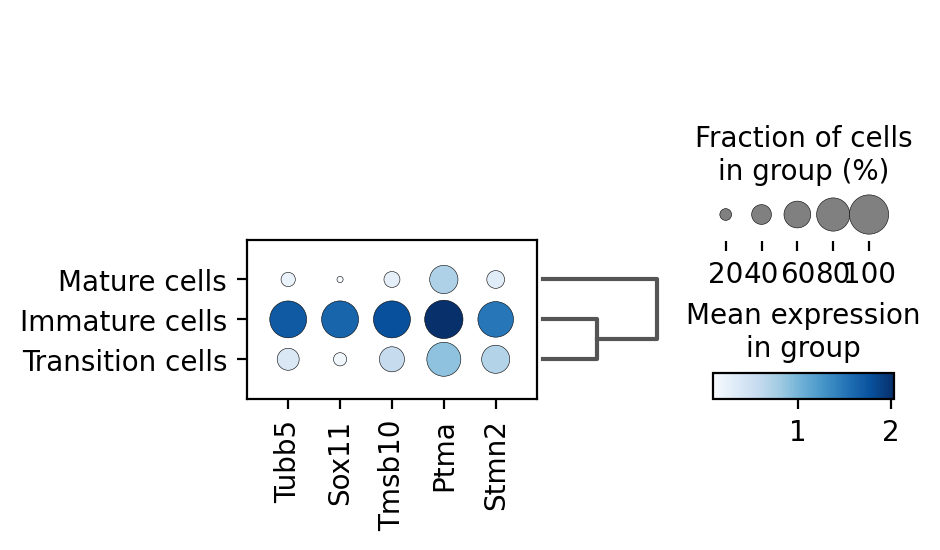

In [126]:
im = ['Tubb5', 'Sox11', 'Tmsb10', 'Ptma', 'Stmn2']
scp.pl.dotplot(f, im,dendrogram=True, cmap='Blues', groupby='celltype', save = 'dotplot-immature-diffexp.pdf')

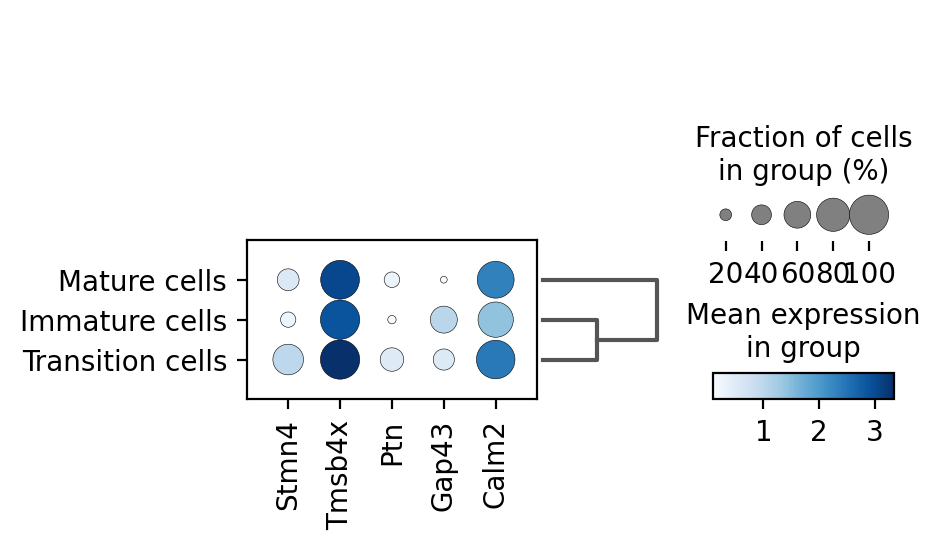

In [127]:
tr = ['Stmn4', 'Tmsb4x', 'Ptn', 'Gap43', 'Calm2']
scp.pl.dotplot(f, tr,dendrogram=True, cmap='Blues', groupby='celltype', save = 'dotplot-trans-diffexp.pdf')

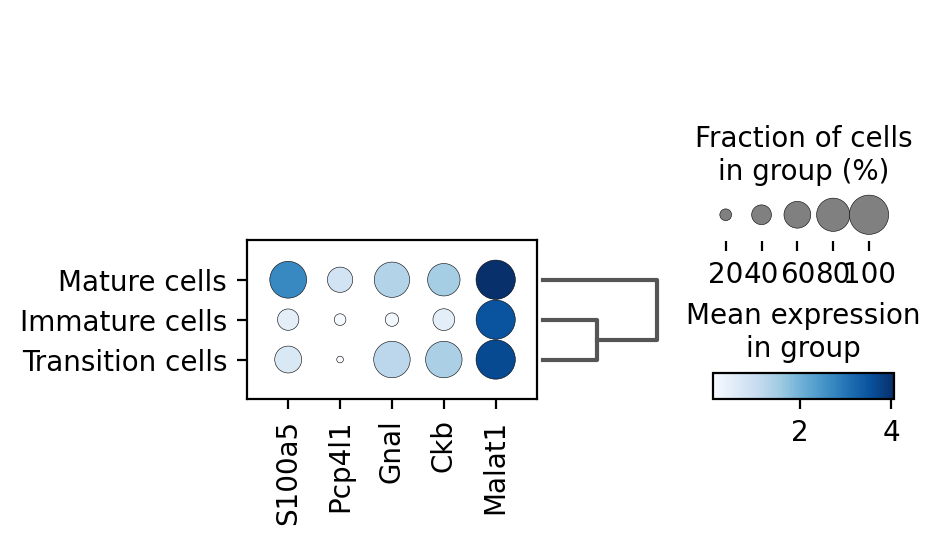

In [128]:
m = ['S100a5', 'Pcp4l1', 'Gnal', 'Ckb', 'Malat1']
scp.pl.dotplot(f, m,dendrogram=True, cmap='Blues', groupby='celltype', save = 'dotplot-mature-diffexp.pdf')

velocity length and confidence

In [156]:
vl = f.obs['velocity_length']
vl.to_csv('velocity_length_wild.csv')

In [157]:
vc = f.obs['velocity_confidence']
vc.to_csv('velocity_confi_wild.csv')